<a href="https://colab.research.google.com/github/HanifFaishalH/pbl_jawara/blob/main/Model_PCVK_Kel3_Update.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
import os
import cv2
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from skimage.feature import graycomatrix, graycoprops, local_binary_pattern
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.svm import SVC
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Mount Drive
drive.mount('/content/drive')

Mounted at /content/drive


## Mengambil Dataset Batik

In [ ]:
# path folder dataset
source_data = '/content/drive/MyDrive/PBL/batik-dataset'

classes = os.listdir(source_data)

data_info = []

for kelas in classes:
    kelas_path = os.path.join(source_data, kelas)

    # Hitung jumlah file gambar
    jumlah_file = len([f for f in os.listdir(kelas_path)
                       if os.path.isfile(os.path.join(kelas_path, f))])

    data_info.append({
        "Kategori": kelas,
        "Jumlah Gambar": jumlah_file
    })

# Buat DataFrame informasi dataset
df = pd.DataFrame(data_info)

print(df)

  Kategori  Jumlah Gambar
0      Cap             48
1    Tulis             48


# Proses Augmentasi Dataset
- Horizonal Flip
- Vertikal Flip
- Zoom 50%

In [ ]:
# --- KONFIGURASI PATH ---
source_data = '/content/drive/MyDrive/PBL/batik-dataset'
base_augmented_output = '/content/drive/MyDrive/PBL/batik-dataset-augmented'

# --- FUNGSI ZOOM IN MANUAL ---
def apply_zoom_in(img, zoom_factor=1.5):
    """
    Melakukan zoom in dengan memotong tengah gambar dan resize balik.
    zoom_factor 1.5 berarti gambar diperbesar 50%.
    """
    w, h = img.size
    crop_w = w / zoom_factor
    crop_h = h / zoom_factor

    # Hitung koordinat tengah
    left = (w - crop_w) / 2
    top = (h - crop_h) / 2
    right = (w + crop_w) / 2
    bottom = (h + crop_h) / 2

    # Crop dan Resize kembali ke ukuran asli
    img_cropped = img.crop((left, top, right, bottom))
    img_resized = img_cropped.resize((w, h), Image.Resampling.LANCZOS)
    return img_resized

if not os.path.exists(base_augmented_output):
    os.makedirs(base_augmented_output)

print(f"Memulai proses augmentasi MANUAL (PASTI) dari: {source_data}")

classes = os.listdir(source_data)
total_overall_final = 0

for class_name in classes:
    source_class_path = os.path.join(source_data, class_name)
    target_class_path = os.path.join(base_augmented_output, class_name)

    # Buat folder target jika belum ada
    if not os.path.exists(target_class_path):
        os.makedirs(target_class_path)

    # Filter file gambar
    image_files = [f for f in os.listdir(source_class_path)
                   if os.path.isfile(os.path.join(source_class_path, f))
                   and f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    if not image_files:
        continue

    original_count = 0
    augmented_count = 0

    print(f"\nMemproses Kelas '{class_name}' ({len(image_files)} gambar)...")

    for original_image_name in tqdm(image_files, desc=f"Augmentasi {class_name}"):
        original_image_path = os.path.join(source_class_path, original_image_name)
        file_root = original_image_name.rsplit('.', 1)[0] # Nama file tanpa ekstensi

        try:
            # Buka gambar menggunakan PIL
            img = Image.open(original_image_path).convert('RGB')

            # 1. SIMPAN GAMBAR ASLI
            save_path_original = os.path.join(target_class_path, original_image_name)
            img.save(save_path_original)
            original_count += 1

            # 2. PROSES ZOOM IN 50%
            img_zoom = apply_zoom_in(img, zoom_factor=1.5)
            img_zoom.save(os.path.join(target_class_path, f"zoom_{original_image_name}"))
            augmented_count += 1

            # 3. PROSES HORIZONTAL FLIP
            img_hflip = img.transpose(Image.FLIP_LEFT_RIGHT)
            img_hflip.save(os.path.join(target_class_path, f"hflip_{original_image_name}"))
            augmented_count += 1

            # 4. PROSES VERTICAL FLIP
            img_vflip = img.transpose(Image.FLIP_TOP_BOTTOM)
            img_vflip.save(os.path.join(target_class_path, f"vflip_{original_image_name}"))
            augmented_count += 1

        except Exception as e:
            print(f"Gagal memproses {original_image_name}: {e}")

    total_final = original_count + augmented_count
    total_overall_final += total_final

    print(f"Selesai kelas '{class_name}'.")
    print(f"Output: {original_count} Asli + {augmented_count} Augmentasi = {total_final} Total File")

print("-" * 50)
print("Proses Selesai! Semua gambar telah diproses secara merata.")
print("Setiap gambar asli sekarang memiliki pasangannya: Original, Zoom, H-Flip, V-Flip.")

Memulai proses augmentasi MANUAL (PASTI) dari: /content/drive/MyDrive/PBL/batik-dataset

Memproses Kelas 'Cap' (48 gambar)...


Augmentasi Cap: 100%|██████████| 48/48 [01:11<00:00,  1.49s/it]


Selesai kelas 'Cap'.
Output: 48 Asli + 144 Augmentasi = 192 Total File

Memproses Kelas 'Tulis' (48 gambar)...


Augmentasi Tulis: 100%|██████████| 48/48 [01:10<00:00,  1.47s/it]

Selesai kelas 'Tulis'.
Output: 48 Asli + 144 Augmentasi = 192 Total File
--------------------------------------------------
Proses Selesai! Semua gambar telah diproses secara merata.
Setiap gambar asli sekarang memiliki pasangannya: Original, Zoom, H-Flip, V-Flip.


In [ ]:
source_data = '/content/drive/MyDrive/PBL/batik-dataset-augmented'

print("Jumlah gambar per kelas:\n")

total = 0

for cls in os.listdir(source_data):
    class_path = os.path.join(source_data, cls)

    # Lewati jika bukan folder
    if not os.path.isdir(class_path):
        continue

    # Hitung file gambar
    count = len([
        f for f in os.listdir(class_path)
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ])

    print(f"{cls}: {count} gambar")
    total += count

print("\nTOTAL SEMUA GAMBAR:", total)

Jumlah gambar per kelas:

Cap: 192 gambar
Tulis: 192 gambar

TOTAL SEMUA GAMBAR: 384


# Preprocessing Data citra

Memulai proses preprocessing...

Memproses kelas 'Cap' (192 gambar)


  0%|          | 0/192 [00:00<?, ?it/s]

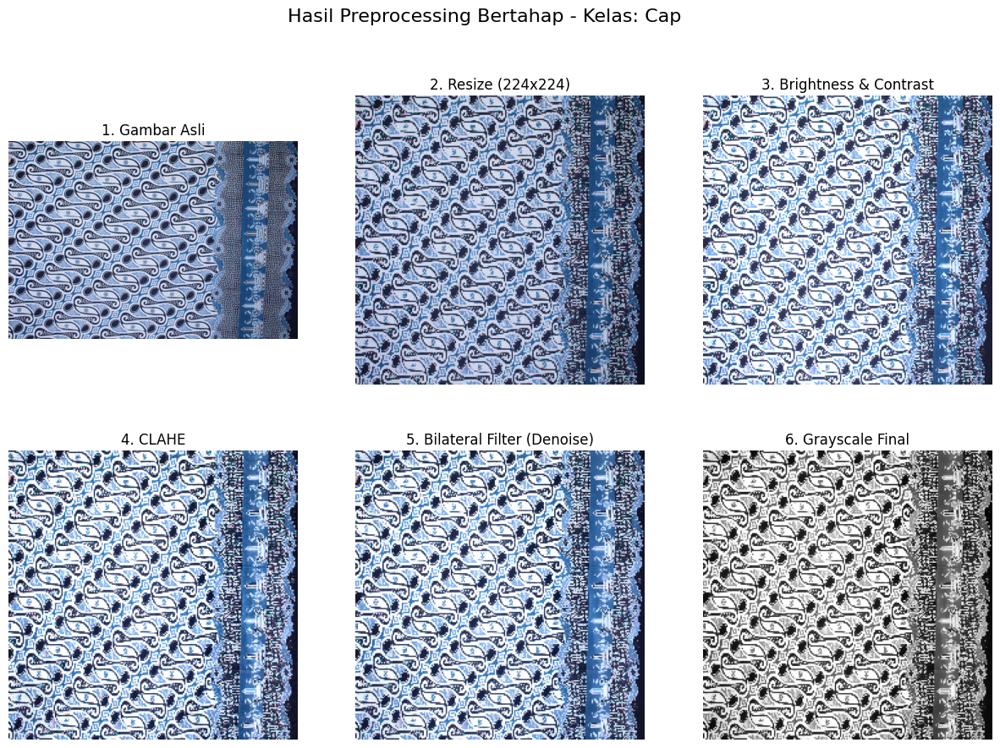

100%|██████████| 192/192 [00:33<00:00,  5.74it/s]


Memproses kelas 'Tulis' (192 gambar)


  0%|          | 0/192 [00:00<?, ?it/s]

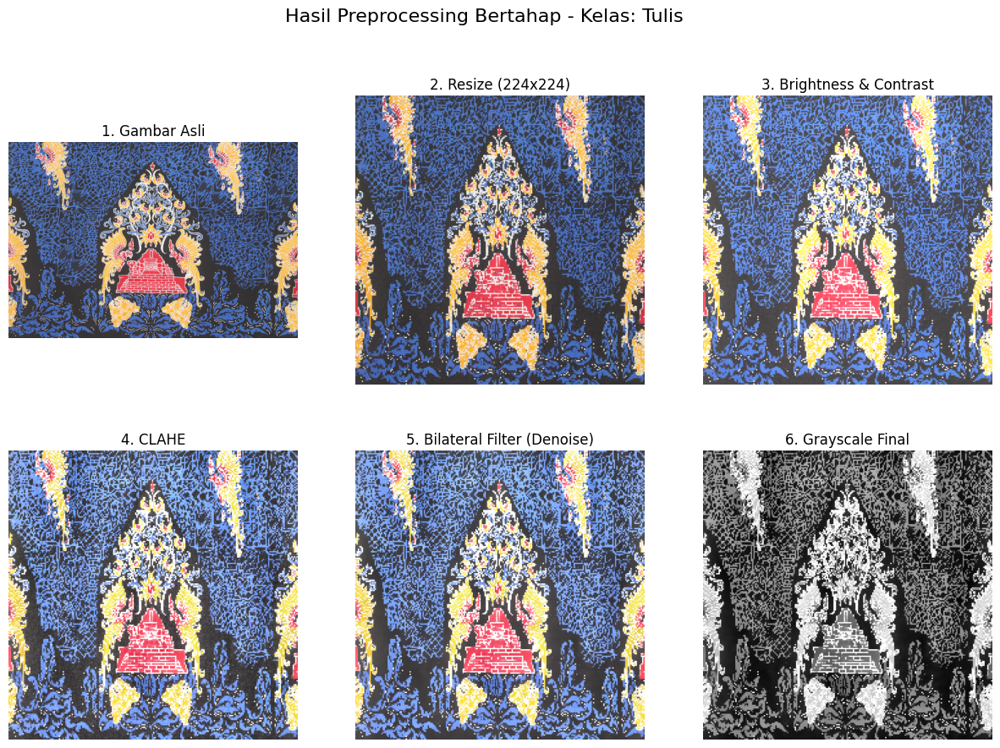

100%|██████████| 192/192 [00:38<00:00,  4.93it/s]


Preprocessing selesai! Semua gambar telah diproses dan divisualisasikan.


In [ ]:
source_data = '/content/drive/MyDrive/PBL/batik-dataset-augmented'
preprocessed_output = "/content/drive/MyDrive/PBL/batik-augmented-preprocessed"

# Buat folder output jika belum ada
if not os.path.exists(preprocessed_output):
    os.makedirs(preprocessed_output)

TARGET_SIZE = (224, 224)  # Ukuran seragam

print("Memulai proses preprocessing...\n")

classes = os.listdir(source_data)

for class_name in classes:
    class_input_path = os.path.join(source_data, class_name)
    class_output_path = os.path.join(preprocessed_output, class_name)

    if not os.path.exists(class_output_path):
        os.makedirs(class_output_path)

    image_files = [
        f for f in os.listdir(class_input_path)
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ]

    print(f"Memproses kelas '{class_name}' ({len(image_files)} gambar)")

    sample_shown = False  # Tampilkan 1 gambar per kelas

    for img_name in tqdm(image_files):
        img_path = os.path.join(class_input_path, img_name)

        # --- Tahap 1: Baca asli ---
        original = cv2.imread(img_path)
        if original is None:
            continue

        original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

        # --- Tahap 2: Resize ---
        resized = cv2.resize(original, TARGET_SIZE)
        resized_rgb = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)

        # --- Tahap 3: Brightness & Contrast ---
        alpha = 1.2   # contrast
        beta = 10     # brightness
        bright_contrast = cv2.convertScaleAbs(resized, alpha=alpha, beta=beta)
        bright_contrast_rgb = cv2.cvtColor(bright_contrast, cv2.COLOR_BGR2RGB)

        # --- Tahap 4: CLAHE ---
        lab = cv2.cvtColor(bright_contrast, cv2.COLOR_BGR2LAB)
        L, A, B = cv2.split(lab)

        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        cl = clahe.apply(L)

        lab_clahe = cv2.merge((cl, A, B))
        clahe_img = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)
        clahe_rgb = cv2.cvtColor(clahe_img, cv2.COLOR_BGR2RGB)

        # --- Tahap 5: Bilateral Filter ---
        bilateral = cv2.bilateralFilter(clahe_img, d=7, sigmaColor=50, sigmaSpace=50)
        bilateral_rgb = cv2.cvtColor(bilateral, cv2.COLOR_BGR2RGB)

        # --- Tahap 6: Grayscale ---
        gray = cv2.cvtColor(bilateral, cv2.COLOR_BGR2GRAY)

        # ------------------------ TAMPILKAN SEMUA TAHAP ------------------------
        if not sample_shown:
            plt.figure(figsize=(15, 10))
            plt.suptitle(f"Hasil Preprocessing Bertahap - Kelas: {class_name}", fontsize=16)

            images = [
                (original_rgb, "1. Gambar Asli"),
                (resized_rgb, "2. Resize (224x224)"),
                (bright_contrast_rgb, "3. Brightness & Contrast"),
                (clahe_rgb, "4. CLAHE"),
                (bilateral_rgb, "5. Bilateral Filter (Denoise)"),
                (gray, "6. Grayscale Final")
            ]

            for i, (img_disp, title) in enumerate(images, 1):
                plt.subplot(2, 3, i)
                if len(img_disp.shape) == 2:
                    plt.imshow(img_disp, cmap='gray')
                else:
                    plt.imshow(img_disp)
                plt.title(title)
                plt.axis("off")

            plt.show()
            sample_shown = True
        # ------------------------------------------------------------------------

        # Simpan grayscale ke output
        output_path = os.path.join(class_output_path, img_name)
        cv2.imwrite(output_path, gray)

print("\nPreprocessing selesai! Semua gambar telah diproses dan divisualisasikan.")

#Ekstraksi fitur (GLCM, LBP, GLCM+LBP) dan Splitting Data

In [ ]:
preprocessed_output = "/content/drive/MyDrive/PBL/batik-augmented-preprocessed"

images = []
labels = []
print("--- LOAD DATA KE MEMORI  ---")

if not os.path.exists(preprocessed_output):
    print(f"ERROR: Folder tidak ditemukan di {preprocessed_output}")
else:
    classes = sorted(os.listdir(preprocessed_output))

    for class_name in classes:
        class_path = os.path.join(preprocessed_output, class_name)

        if not os.path.isdir(class_path):
            continue

        files = [f for f in os.listdir(class_path)
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        print(f"Memuat kelas '{class_name}': Ditemukan {len(files)} gambar")

        # Debugging: Jika 0, tampilkan apa isi foldernya sebenarnya
        if len(files) == 0:
            print(f"   -> Cek isi folder {class_name}: {os.listdir(class_path)[:5]} ...")

        for f in files:
            img_path = os.path.join(class_path, f)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

            if img is not None:
                images.append(img)
                labels.append(class_name)
            else:
                print(f"   -> Gagal membaca: {f}")

    images_np = np.array(images)
    labels_np = np.array(labels)

    print(f"\nTotal gambar berhasil dimuat: {len(images_np)}")

    if len(images_np) > 0:
        print("Lanjutkan ke Ekstraksi Fitur")
    else:
        print("STOP: Tidak ada gambar yang dimuat. Cek path Google Drive Anda.")

--- LOAD DATA KE MEMORI  ---
Memuat kelas 'Cap': Ditemukan 192 gambar
Memuat kelas 'Tulis': Ditemukan 192 gambar

Total gambar berhasil dimuat: 384
Lanjutkan ke Ekstraksi Fitur


In [ ]:
print("--- DATA SPLITTING & PREPARATION For CNN ---")

# 1. Encode Label
le = LabelEncoder()
y_encoded = le.fit_transform(labels_np)
classes_names = le.classes_

print(f"Kelas Label: {classes_names}")

# SPLIT UNTUK CNN (Data Gambar)
print("\nPersiapan Data CNN")
# Normalisasi dan Reshape (tambah dimensi channel)
X_cnn_all = images_np.reshape(images_np.shape + (1,)) / 255.0

# Split khusus untuk CNN
X_train_cnn, X_test_cnn, y_train_cnn, y_test_cnn = train_test_split(
    X_cnn_all, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

print(f"Data Training CNN : {X_train_cnn.shape[0]} gambar")
print(f"Data Testing CNN  : {X_test_cnn.shape[0]} gambar")
print(f"Dimensi Gambar    : {X_train_cnn.shape[1:]}")

--- DATA SPLITTING & PREPARATION For CNN ---
Kelas Label: ['Cap' 'Tulis']

Persiapan Data CNN
Data Training CNN : 307 gambar
Data Testing CNN  : 77 gambar
Dimensi Gambar    : (224, 224, 1)


In [ ]:
print(f"--- MENGEKSTRAK FITUR DARI {len(images_np)} GAMBAR ---")

if len(images_np) != len(y_encoded):
    print("Jumlah gambar di memori tidak sama dengan label encoded.")
    print("Jalankan ulang Data Splitting")

# A. GLCM
print(">> 1. Ekstraksi GLCM...")
glcdm_features = []
distances = [1, 2, 3]
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]

for image in tqdm(images_np):
    glcm = graycomatrix(image, distances=distances, angles=angles, levels=256, symmetric=True, normed=True)
    feats = np.hstack([graycoprops(glcm, prop).flatten() for prop in ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation']])
    glcdm_features.append(feats)
glcdm_features_np = np.array(glcdm_features)

# B. LBP
print(">> 2. Ekstraksi LBP...")
lbp_features = []
radius = 1; n_points = 8 * radius; n_bins = n_points + 2

for image in tqdm(images_np):
    lbp = local_binary_pattern(image, n_points, radius, method='uniform')
    hist, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)
    lbp_features.append(hist)
lbp_features_np = np.array(lbp_features)

# C. Definisi Ulang Skenario (Update Variabel Global)
feature_scenarios = {
    "GLCM Only": glcdm_features_np,
    "LBP Only": lbp_features_np,
    "GLCM + LBP": np.hstack((glcdm_features_np, lbp_features_np))
}

# Tampilkan dimensi fitur
print("\n=== DIMENSI FITUR ===")
print(f"GLCM shape        : {glcdm_features_np.shape}  --> jumlah fitur: {glcdm_features_np.shape[1]}")
print(f"LBP shape         : {lbp_features_np.shape}    --> jumlah fitur: {lbp_features_np.shape[1]}")
print(f"GLCM + LBP shape  : {feature_scenarios['GLCM + LBP'].shape} --> jumlah fitur: {feature_scenarios['GLCM + LBP'].shape[1]}")

print(f"Sukses! Fitur sekarang memiliki {len(glcdm_features_np)} sampel.")

--- MENGEKSTRAK FITUR DARI 384 GAMBAR ---
>> 1. Ekstraksi GLCM...


100%|██████████| 384/384 [00:23<00:00, 16.31it/s]


>> 2. Ekstraksi LBP...


100%|██████████| 384/384 [00:03<00:00, 99.90it/s]


=== DIMENSI FITUR ===
GLCM shape        : (384, 60)  --> jumlah fitur: 60
LBP shape         : (384, 10)    --> jumlah fitur: 10
GLCM + LBP shape  : (384, 70) --> jumlah fitur: 70
Sukses! Fitur sekarang memiliki 384 sampel.


#KLASIFIKASI (SVM, CNN, DNN)

In [ ]:
all_model_results = []

import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report
from sklearn.svm import SVC
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input, Conv2D, MaxPooling2D, Flatten

# Definisi Data Fitur
feature_scenarios = {
    "GLCM Only": glcdm_features_np,
    "LBP Only": lbp_features_np,
    "GLCM + LBP": np.hstack((glcdm_features_np, lbp_features_np))
}

#SVM

--- PELATIHAN SVM (3 SKENARIO) ---

PEMROSESAN SKENARIO: GLCM Only

[Akurasi Train]: 0.9479
[Akurasi Test ]: 0.8831

[Laporan Klasifikasi - GLCM Only]
              precision    recall  f1-score   support

         Cap       0.84      0.95      0.89        39
       Tulis       0.94      0.82      0.87        38

    accuracy                           0.88        77
   macro avg       0.89      0.88      0.88        77
weighted avg       0.89      0.88      0.88        77

[Matriks Konfusi - GLCM Only]


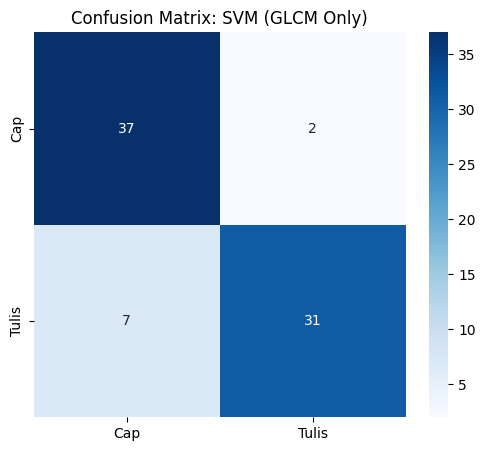


PEMROSESAN SKENARIO: LBP Only

[Akurasi Train]: 0.8404
[Akurasi Test ]: 0.8571

[Laporan Klasifikasi - LBP Only]
              precision    recall  f1-score   support

         Cap       0.80      0.95      0.87        39
       Tulis       0.94      0.76      0.84        38

    accuracy                           0.86        77
   macro avg       0.87      0.86      0.86        77
weighted avg       0.87      0.86      0.86        77

[Matriks Konfusi - LBP Only]


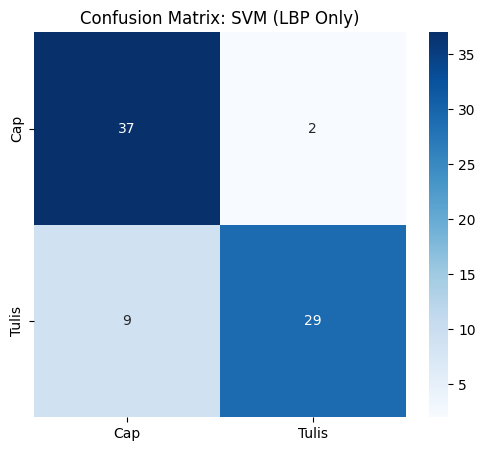


PEMROSESAN SKENARIO: GLCM + LBP

[Akurasi Train]: 0.9935
[Akurasi Test ]: 0.9610

[Laporan Klasifikasi - GLCM + LBP]
              precision    recall  f1-score   support

         Cap       0.97      0.95      0.96        39
       Tulis       0.95      0.97      0.96        38

    accuracy                           0.96        77
   macro avg       0.96      0.96      0.96        77
weighted avg       0.96      0.96      0.96        77

[Matriks Konfusi - GLCM + LBP]


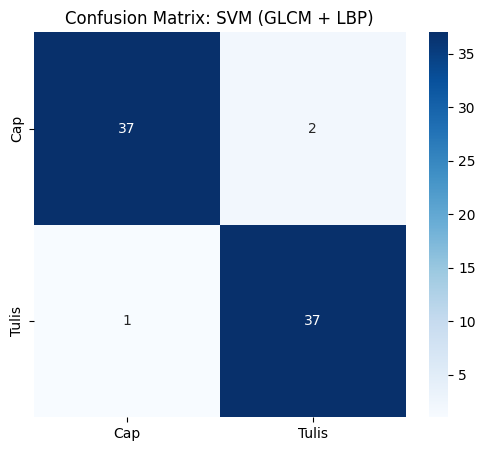

In [ ]:
print("--- PELATIHAN SVM (3 SKENARIO) ---")

if 'all_model_results' not in locals():
    all_model_results = []

# Cek ketersediaan variabel
if 'y_encoded' not in locals():
    print("Error: Variabel 'y_encoded' tidak ditemukan.")
else:
    for feature_name, X_data in feature_scenarios.items():
        print(f"\n{'='*60}")
        print(f"PEMROSESAN SKENARIO: {feature_name}")
        print(f"{'='*60}")

        # 1. Split Data
        X_train, X_test, y_train, y_test = train_test_split(
            X_data, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
        )

        # 2. Scaling
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # 3. Train SVM
        svm = SVC(kernel='linear', random_state=42)
        svm.fit(X_train_scaled, y_train)

        # 4. Prediksi & Evaluasi
        y_pred = svm.predict(X_test_scaled)

        train_acc = svm.score(X_train_scaled, y_train)
        test_acc = accuracy_score(y_test, y_pred)
        print(f"\n[Akurasi Train]: {train_acc:.4f}")
        print(f"[Akurasi Test ]: {test_acc:.4f}")

        # B. Laporan Klasifikasi
        print(f"\n[Laporan Klasifikasi - {feature_name}]")
        if 'classes_names' in locals():
            print(classification_report(y_test, y_pred, target_names=classes_names))
        else:
            print(classification_report(y_test, y_pred))

        # C. Matriks Konfusi
        print(f"[Matriks Konfusi - {feature_name}]")
        cm = confusion_matrix(y_test, y_pred)

        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=classes_names if 'classes_names' in locals() else 'auto',
                    yticklabels=classes_names if 'classes_names' in locals() else 'auto')
        plt.title(f'Confusion Matrix: SVM ({feature_name})')
        plt.show()

        # Simpan ke list global (LENGKAP)
        all_model_results.append({
            "Model": "SVM",
            "Fitur": feature_name,
            "Akurasi": test_acc,
            "Train_Acc": train_acc,
            "Test_Acc": test_acc
        })

#CNN

--- PELATIHAN CNN (DATA CITRA) ---
>> Sedang melatih CNN...
Epoch 1/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 16s 677ms/step - accuracy: 0.4624 - loss: 1.8719
Epoch 2/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - accuracy: 0.5044 - loss: 0.6895
Epoch 3/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.5433 - loss: 0.6763
Epoch 4/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - accuracy: 0.6078 - loss: 0.6908
Epoch 5/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.4809 - loss: 0.6773
Epoch 6/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - accuracy: 0.5917 - loss: 0.6738
Epoch 7/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.5921 - loss: 0.6271
Epoch 8/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - accuracy: 0.6726 - loss: 0.6285
Epoch 9/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - accuracy: 0.6097 - loss: 0.5946
Epoch 10/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - accuracy: 0.7045 - loss: 0.5783
Epoch 11/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - accuracy: 0.7817 - los

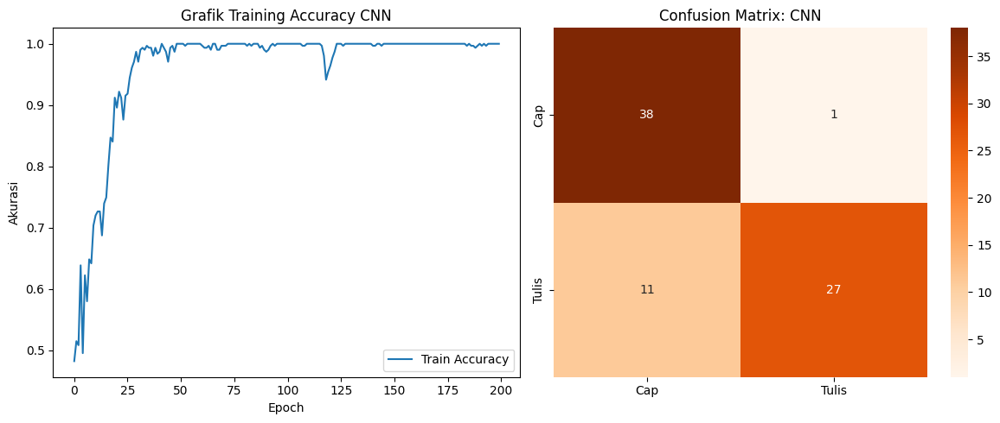

In [ ]:
print("--- PELATIHAN CNN (DATA CITRA) ---")

if 'all_model_results' not in locals():
    all_model_results = []

# 1. Siapkan Data Citra
X_cnn_all = images_np.reshape(images_np.shape + (1,)) / 255.0

# Split Data
X_train_cnn, X_test_cnn, y_train_cnn, y_test_cnn = train_test_split(
    X_cnn_all, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

# 2. Arsitektur CNN
model_cnn = Sequential([
    Input(shape=X_train_cnn.shape[1:]),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model_cnn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# 3. Train
print(">> Sedang melatih CNN...")
history_cnn = model_cnn.fit(X_train_cnn, y_train_cnn, epochs=200, batch_size=32, verbose=1)

# 4. Evaluasi Train & Test
print("\n[Menghitung Skor Akhir CNN...]")

_, train_acc_cnn = model_cnn.evaluate(X_train_cnn, y_train_cnn, verbose=0)
_, test_acc_cnn = model_cnn.evaluate(X_test_cnn, y_test_cnn, verbose=0)

y_pred_prob_cnn = model_cnn.predict(X_test_cnn)
y_pred_cnn = (y_pred_prob_cnn > 0.5).astype(int)

print(f"\n[Akurasi Train]: {train_acc_cnn:.4f}")
print(f"[Akurasi Test ]: {test_acc_cnn:.4f}")

# A. Laporan Klasifikasi
print(f"\n[Laporan Klasifikasi - CNN]")
if 'classes_names' in locals():
    print(classification_report(y_test_cnn, y_pred_cnn, target_names=classes_names))
else:
    print(classification_report(y_test_cnn, y_pred_cnn))

# B. Visualisasi Grafik & Matriks
plt.figure(figsize=(12, 5))

# Plot 1: Grafik Akurasi
plt.subplot(1, 2, 1)
plt.plot(history_cnn.history['accuracy'], label='Train Accuracy')

if 'val_accuracy' in history_cnn.history:
    plt.plot(history_cnn.history['val_accuracy'], label='Val Accuracy')
plt.title('Grafik Training Accuracy CNN')
plt.xlabel('Epoch')
plt.ylabel('Akurasi')
plt.legend()

# Plot 2: Matriks Konfusi
cm_cnn = confusion_matrix(y_test_cnn, y_pred_cnn)
plt.subplot(1, 2, 2)
sns.heatmap(cm_cnn, annot=True, fmt='d', cmap='Oranges',
            xticklabels=classes_names if 'classes_names' in locals() else 'auto',
            yticklabels=classes_names if 'classes_names' in locals() else 'auto')
plt.title('Confusion Matrix: CNN')

plt.tight_layout()
plt.show()

# Simpan ke list global (LENGKAP)
all_model_results.append({
    "Model": "CNN",
    "Fitur": "Raw Image",
    "Akurasi": test_acc_cnn,
    "Train_Acc": train_acc_cnn,
    "Test_Acc": test_acc_cnn
})

#DNN

--- PELATIHAN DNN (3 SKENARIO) ---

PEMROSESAN SKENARIO: GLCM Only
   -> Sedang melatih model...
Epoch 1/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 270ms/step - accuracy: 0.5597 - loss: 0.7162
Epoch 2/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7115 - loss: 0.5281 
Epoch 3/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7935 - loss: 0.4651 
Epoch 4/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8386 - loss: 0.3519 
Epoch 5/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7978 - loss: 0.3856 
Epoch 6/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8694 - loss: 0.3035 
Epoch 7/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8692 - loss: 0.2551 
Epoch 8/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8760 - loss: 0.2402 
Epoch 9/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8798 - loss: 0.2089 
Epoch 10/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8882 - loss: 0.2172 
Epoch 11/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0

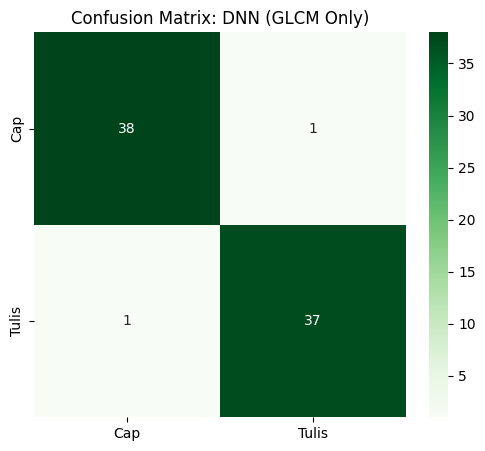


PEMROSESAN SKENARIO: LBP Only
   -> Sedang melatih model...
Epoch 1/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - accuracy: 0.4826 - loss: 0.7124
Epoch 2/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6830 - loss: 0.6305 
Epoch 3/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7110 - loss: 0.5869 
Epoch 4/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7657 - loss: 0.5407 
Epoch 5/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7603 - loss: 0.5140 
Epoch 6/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8026 - loss: 0.4536 
Epoch 7/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8478 - loss: 0.4077 
Epoch 8/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8503 - loss: 0.3866 
Epoch 9/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8722 - loss: 0.3409 
Epoch 10/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8789 - loss: 0.2851 
Epoch 11/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8733 - loss

1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step

[Akurasi Akhir (Test)]: 0.9870

[Laporan Klasifikasi - LBP Only]
              precision    recall  f1-score   support

         Cap       1.00      0.97      0.99        39
       Tulis       0.97      1.00      0.99        38

    accuracy                           0.99        77
   macro avg       0.99      0.99      0.99        77
weighted avg       0.99      0.99      0.99        77

[Matriks Konfusi - LBP Only]


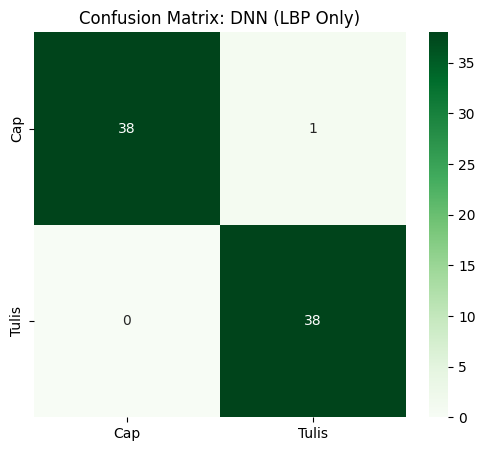


PEMROSESAN SKENARIO: GLCM + LBP
   -> Sedang melatih model...
Epoch 1/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 229ms/step - accuracy: 0.5469 - loss: 0.7779
Epoch 2/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7790 - loss: 0.4776 
Epoch 3/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7991 - loss: 0.4532 
Epoch 4/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8508 - loss: 0.3772 
Epoch 5/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8274 - loss: 0.3089 
Epoch 6/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8700 - loss: 0.2733  
Epoch 7/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9181 - loss: 0.2126 
Epoch 8/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9247 - loss: 0.1866 
Epoch 9/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9496 - loss: 0.1736 
Epoch 10/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9558 - loss: 0.1395 
Epoch 11/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9515 - l

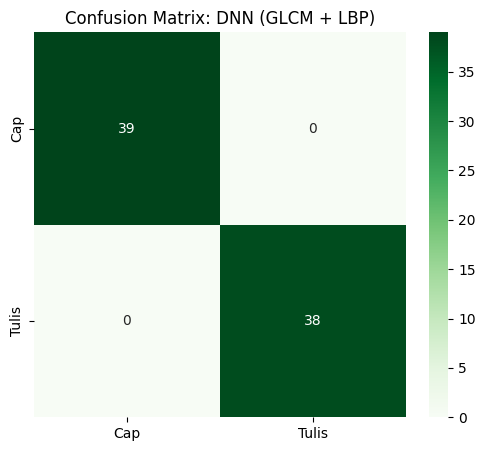

In [ ]:
print("--- PELATIHAN DNN (3 SKENARIO) ---")

if 'y_encoded' not in locals():
    print("Error: Variabel 'y_encoded' tidak ditemukan. Jalankan Langkah 5 terlebih dahulu.")
else:
    for feature_name, X_data in feature_scenarios.items():
        print(f"\n{'='*60}")
        print(f"PEMROSESAN SKENARIO: {feature_name}")
        print(f"{'='*60}")

        # 1. Split Data
        X_train, X_test, y_train, y_test = train_test_split(
            X_data, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
        )

        # 2. Scaling
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # 3. Buat Arsitektur DNN
        input_dim = X_train_scaled.shape[1]
        model_dnn = Sequential([
            Input(shape=(input_dim,)),
            Dense(128, activation='relu'), Dropout(0.3),
            Dense(64, activation='relu'), Dropout(0.3),
            Dense(32, activation='relu'), Dropout(0.3),
            Dense(1, activation='sigmoid')
        ])

        model_dnn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

        # 4. Train
        print("   -> Sedang melatih model...")
        model_dnn.fit(X_train_scaled, y_train, epochs=200, batch_size=32, verbose=1)

        # 5. Prediksi & Evaluasi Test
        y_pred_prob = model_dnn.predict(X_test_scaled)
        y_pred = (y_pred_prob > 0.5).astype(int)
        test_acc = accuracy_score(y_test, y_pred)

        _, train_acc = model_dnn.evaluate(X_train_scaled, y_train, verbose=0)

        print(f"\n[Akurasi Akhir (Test)]: {test_acc:.4f}")

        # B. Laporan Klasifikasi
        print(f"\n[Laporan Klasifikasi - {feature_name}]")
        if 'classes_names' in locals():
            print(classification_report(y_test, y_pred, target_names=classes_names))
        else:
            print(classification_report(y_test, y_pred))

        # C. Matriks Konfusi
        print(f"[Matriks Konfusi - {feature_name}]")
        cm = confusion_matrix(y_test, y_pred)

        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
                    xticklabels=classes_names if 'classes_names' in locals() else 'auto',
                    yticklabels=classes_names if 'classes_names' in locals() else 'auto')
        plt.title(f'Confusion Matrix: DNN ({feature_name})')
        plt.show()

        # Simpan ke list global
        all_model_results.append({
            "Model": "DNN",
            "Fitur": feature_name,
            "Akurasi": test_acc,
            "Test_Acc": test_acc,
            "Train_Acc": train_acc
        })

#PERBANDINGAN

--- PERBANDINGAN FINAL SEMUA MODEL (TRAIN vs TEST) ---

[Tabel Peringkat & Diagnosa Overfitting]
Model      Fitur  Train_Acc  Test_Acc       Gap  Status
  DNN GLCM + LBP   1.000000  1.000000  0.000000    GOOD
  DNN   LBP Only   0.996743  0.987013  0.009730    GOOD
  DNN  GLCM Only   1.000000  0.974026  0.025974    GOOD
  SVM GLCM + LBP   0.993485  0.961039  0.032446    GOOD
  SVM  GLCM Only   0.947883  0.883117  0.064766    GOOD
  SVM   LBP Only   0.840391  0.857143 -0.016752    GOOD
  CNN  Raw Image   1.000000  0.844156  0.155844 OVERFIT


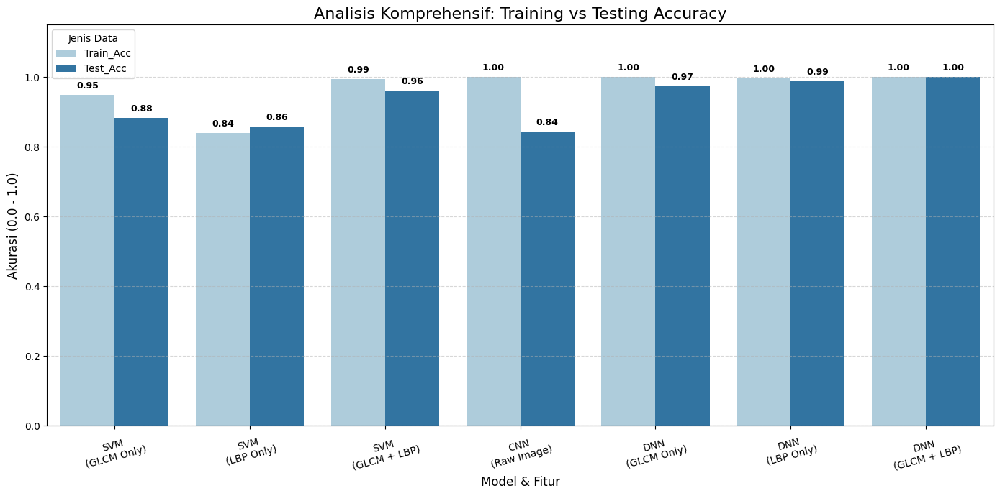

------------------------------------------------------------
KESIMPULAN AKHIR:
Model Juara 1   : **DNN** (GLCM + LBP)
Akurasi Ujian   : **1.0000**
Akurasi Latihan : **1.0000**
Status Model    : **GOOD**
------------------------------------------------------------


In [ ]:
print("--- PERBANDINGAN FINAL SEMUA MODEL (TRAIN vs TEST) ---")

# 1. Buat DataFrame
df_final = pd.DataFrame(all_model_results)

# 2. Tambahkan Kolom Cek Overfitting
df_final['Gap'] = df_final['Train_Acc'] - df_final['Test_Acc']
df_final['Status'] = df_final['Gap'].apply(lambda x: "OVERFIT" if x > 0.1 else ("UNDERFIT" if x < -0.05 else "GOOD"))

# 3. Tampilkan Tabel
cols_to_show = ['Model', 'Fitur', 'Train_Acc', 'Test_Acc', 'Gap', 'Status']
df_sorted = df_final.sort_values(by="Test_Acc", ascending=False)

print("\n[Tabel Peringkat & Diagnosa Overfitting]")
print(df_sorted[cols_to_show].to_string(index=False))

# 4. Visualisasi Grafik
plt.figure(figsize=(14, 7))

df_for_plot = df_final[['Model', 'Fitur', 'Train_Acc', 'Test_Acc']].copy()

df_melted = df_for_plot.melt(
    id_vars=['Model', 'Fitur'],
    value_vars=['Train_Acc', 'Test_Acc'],
    var_name='Dataset',
    value_name='Akurasi'
)

# Buat Label Gabungan untuk Sumbu X
df_melted['Label_Grafik'] = df_melted['Model'] + "\n(" + df_melted['Fitur'] + ")"

# Plotting
plot = sns.barplot(
    data=df_melted,
    x="Label_Grafik",
    y="Akurasi",
    hue="Dataset",
    palette="Paired"
)

# Tambahkan label angka di atas bar
for p in plot.patches:
    if p.get_height() > 0:
        plot.annotate(f"{p.get_height():.2f}",
                      (p.get_x() + p.get_width() / 2., p.get_height()),
                      ha = 'center', va = 'center',
                      xytext = (0, 9),
                      textcoords = 'offset points',
                      fontsize=9, fontweight='bold')

plt.title('Analisis Komprehensif: Training vs Testing Accuracy', fontsize=16)
plt.ylabel('Akurasi (0.0 - 1.0)', fontsize=12)
plt.xlabel('Model & Fitur', fontsize=12)
plt.ylim(0, 1.15)
plt.xticks(rotation=15)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(title="Jenis Data")
plt.tight_layout()
plt.show()

# 5. Kesimpulan Akhir
best_row = df_sorted.iloc[0]
print("-" * 60)
print(f"KESIMPULAN AKHIR:")
print(f"Model Juara 1   : **{best_row['Model']}** ({best_row['Fitur']})")
print(f"Akurasi Ujian   : **{best_row['Test_Acc']:.4f}**")
print(f"Akurasi Latihan : **{best_row['Train_Acc']:.4f}**")
print(f"Status Model    : **{best_row['Status']}**")
print("-" * 60)

### Evaluasi Model

=== EVALUASI MODEL: SVM, DNN, CNN ===
Beberapa model belum ada di memori. Pastikan sudah dilatih sebelumnya.

🔹 Evaluasi: SVM
Akurasi SVM: 0.9610

Classification Report (SVM):
              precision    recall  f1-score   support

         Cap       0.97      0.95      0.96        39
       Tulis       0.95      0.97      0.96        38

    accuracy                           0.96        77
   macro avg       0.96      0.96      0.96        77
weighted avg       0.96      0.96      0.96        77



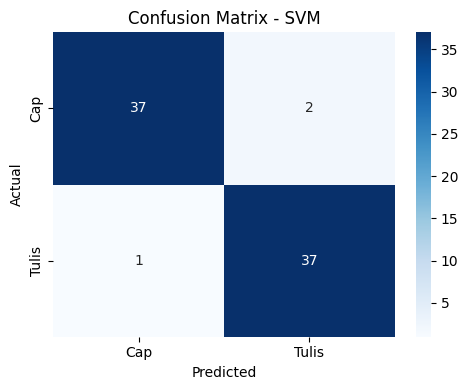


🔹 Evaluasi: DNN
Akurasi DNN: 1.0000

Classification Report (DNN):
              precision    recall  f1-score   support

         Cap       1.00      1.00      1.00        39
       Tulis       1.00      1.00      1.00        38

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



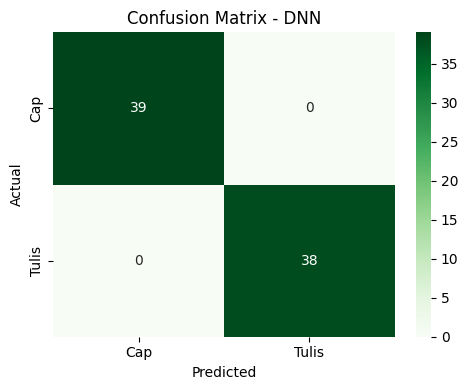


🔹 Evaluasi: CNN (Raw Image)
Akurasi CNN: 0.8442

Classification Report (CNN):
              precision    recall  f1-score   support

         Cap       0.78      0.97      0.86        39
       Tulis       0.96      0.71      0.82        38

    accuracy                           0.84        77
   macro avg       0.87      0.84      0.84        77
weighted avg       0.87      0.84      0.84        77



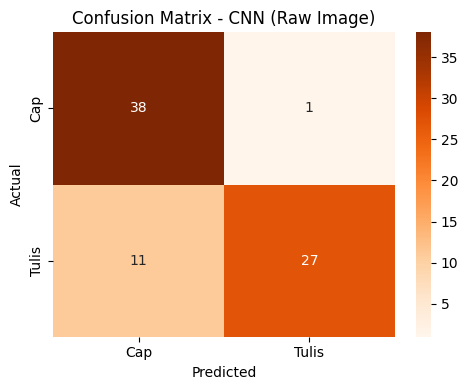


=== HASIL EVALUASI AKHIR ===
  Model  Accuracy  Precision    Recall  F1-Score
0   DNN  1.000000   1.000000  1.000000  1.000000
1   SVM  0.961039   0.961363  0.961039  0.961039
2   CNN  0.844156   0.868672  0.844156  0.841204


/tmp/ipython-input-674966535.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_eval, x="Model", y="Accuracy", palette="Set2")


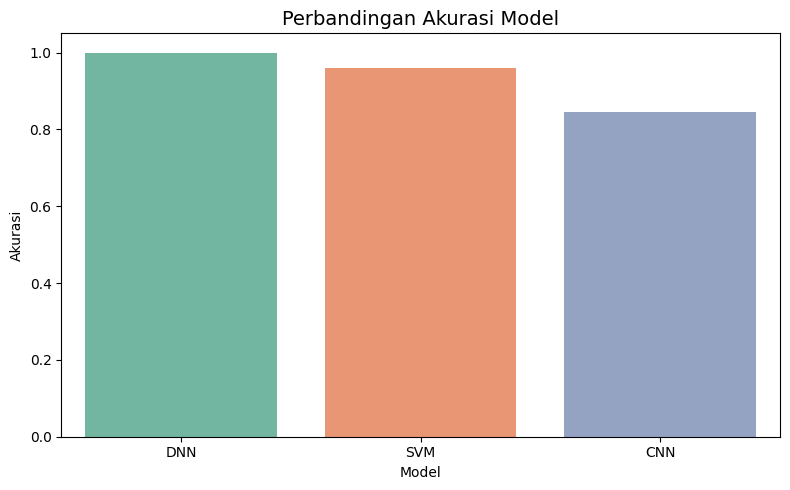

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

print("=== EVALUASI MODEL: SVM, DNN, CNN ===")

# Pastikan semua model sudah tersedia di memori
if not all(var in locals() for var in ['svm', 'model_dnn', 'model_cnn']):
    print("Beberapa model belum ada di memori. Pastikan sudah dilatih sebelumnya.")

# Penampung hasil
eval_results = []

# ========== 1️⃣ Evaluasi SVM ==========
print("\n🔹 Evaluasi: SVM")
y_pred_svm = svm.predict(X_test_scaled)

acc_svm = accuracy_score(y_test, y_pred_svm)
prec_svm = precision_score(y_test, y_pred_svm, average='weighted', zero_division=0)
rec_svm = recall_score(y_test, y_pred_svm, average='weighted', zero_division=0)
f1_svm = f1_score(y_test, y_pred_svm, average='weighted', zero_division=0)

print(f"Akurasi SVM: {acc_svm:.4f}")
print("\nClassification Report (SVM):")
print(classification_report(y_test, y_pred_svm, target_names=classes_names))

# Confusion Matrix SVM
cm_svm = confusion_matrix(y_test, y_pred_svm)
plt.figure(figsize=(5, 4))
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Blues',
            xticklabels=classes_names, yticklabels=classes_names)
plt.title("Confusion Matrix - SVM")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

eval_results.append(["SVM", acc_svm, prec_svm, rec_svm, f1_svm])

# ========== 2️⃣ Evaluasi DNN ==========
print("\n🔹 Evaluasi: DNN")
y_pred_prob_dnn = model_dnn.predict(X_test_scaled, verbose=0)
y_pred_dnn = (y_pred_prob_dnn > 0.5).astype(int).ravel()

acc_dnn = accuracy_score(y_test, y_pred_dnn)
prec_dnn = precision_score(y_test, y_pred_dnn, average='weighted', zero_division=0)
rec_dnn = recall_score(y_test, y_pred_dnn, average='weighted', zero_division=0)
f1_dnn = f1_score(y_test, y_pred_dnn, average='weighted', zero_division=0)

print(f"Akurasi DNN: {acc_dnn:.4f}")
print("\nClassification Report (DNN):")
print(classification_report(y_test, y_pred_dnn, target_names=classes_names))

# Confusion Matrix DNN
cm_dnn = confusion_matrix(y_test, y_pred_dnn)
plt.figure(figsize=(5, 4))
sns.heatmap(cm_dnn, annot=True, fmt='d', cmap='Greens',
            xticklabels=classes_names, yticklabels=classes_names)
plt.title("Confusion Matrix - DNN")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

eval_results.append(["DNN", acc_dnn, prec_dnn, rec_dnn, f1_dnn])

# ========== 3️⃣ Evaluasi CNN ==========
print("\n🔹 Evaluasi: CNN (Raw Image)")
y_pred_prob_cnn = model_cnn.predict(X_test_cnn, verbose=0)
y_pred_cnn = (y_pred_prob_cnn > 0.5).astype(int).ravel()

acc_cnn = accuracy_score(y_test_cnn, y_pred_cnn)
prec_cnn = precision_score(y_test_cnn, y_pred_cnn, average='weighted', zero_division=0)
rec_cnn = recall_score(y_test_cnn, y_pred_cnn, average='weighted', zero_division=0)
f1_cnn = f1_score(y_test_cnn, y_pred_cnn, average='weighted', zero_division=0)

print(f"Akurasi CNN: {acc_cnn:.4f}")
print("\nClassification Report (CNN):")
print(classification_report(y_test_cnn, y_pred_cnn, target_names=classes_names))

# Confusion Matrix CNN
cm_cnn = confusion_matrix(y_test_cnn, y_pred_cnn)
plt.figure(figsize=(5, 4))
sns.heatmap(cm_cnn, annot=True, fmt='d', cmap='Oranges',
            xticklabels=classes_names, yticklabels=classes_names)
plt.title("Confusion Matrix - CNN (Raw Image)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

eval_results.append(["CNN", acc_cnn, prec_cnn, rec_cnn, f1_cnn])

# ========== 4️⃣ Rangkuman ==========
df_eval = pd.DataFrame(eval_results, columns=["Model", "Accuracy", "Precision", "Recall", "F1-Score"])
df_eval = df_eval.sort_values(by="Accuracy", ascending=False).reset_index(drop=True)

print("\n=== HASIL EVALUASI AKHIR ===")
print(df_eval)

# Visualisasi
plt.figure(figsize=(8, 5))
sns.barplot(data=df_eval, x="Model", y="Accuracy", palette="Set2")
plt.title("Perbandingan Akurasi Model", fontsize=14)
plt.ylabel("Akurasi")
plt.ylim(0, 1.05)
plt.tight_layout()
plt.show()


#**SIMPAN MODEL**

**DNN GLCM + LBP**

In [ ]:
import os
import joblib

# Folder tujuan
save_dir = "/content/drive/MyDrive/PBL/Model"

# Buat folder jika belum ada
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
    print(f"[INFO] Folder dibuat: {save_dir}")

# --- PERUBAHAN DI SINI (Ganti ekstensi .keras menjadi .h5) ---
model_filename = os.path.join(save_dir, f"dnn_model_{feature_name}.h5")
scaler_filename = os.path.join(save_dir, f"dnn_scaler_{feature_name}.pkl")

# Simpan model dengan format H5
# save_format='h5' memaksa Keras menyimpan dalam format HDF5 legacy
model_dnn.save(model_filename, save_format='h5')

# Simpan scaler (Tetap menggunakan joblib/.pkl)
joblib.dump(scaler, scaler_filename)

print("="*50)
print(f"[INFO] Model DNN disimpan di: {model_filename}")
print(f"[INFO] Scaler disimpan di: {scaler_filename}")
print("="*50)

[INFO] Model DNN disimpan di: /content/drive/MyDrive/PBL/Model/dnn_model_GLCM + LBP.h5
[INFO] Scaler disimpan di: /content/drive/MyDrive/PBL/Model/dnn_scaler_GLCM + LBP.pkl


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
=== PREDIKSI DNN DARI FOLDER DRIVE ===
Model yang dipakai : /content/drive/MyDrive/PBL/Model/dnn_model_GLCM + LBP.h5
Scaler yang dipakai: /content/drive/MyDrive/PBL/Model/dnn_scaler_GLCM + LBP.pkl
✅ Model & Scaler ditemukan, lanjut...

✅ Mengambil gambar dari folder:
/content/drive/MyDrive/PBL/Independent Test
✅ Ditemukan 10 gambar


Memproses: Nonik AD_28.JPG


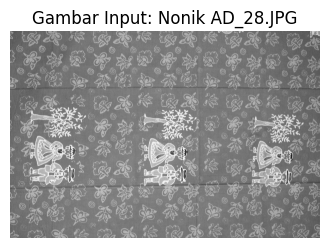

===== HASIL PREDIKSI DNN =====
Probabilitas : 5.67%
Index kelas  : 0
Label         : Cap

Memproses: IMG_8890.JPG


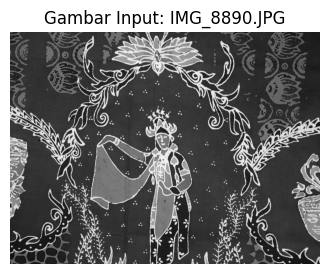

===== HASIL PREDIKSI DNN =====
Probabilitas : 100.00%
Index kelas  : 1
Label         : Tulis

Memproses: IMG_2959.JPG


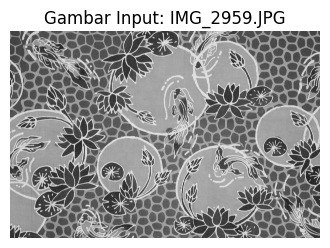

===== HASIL PREDIKSI DNN =====
Probabilitas : 100.00%
Index kelas  : 1
Label         : Tulis

Memproses: Nonik AD_48.JPG


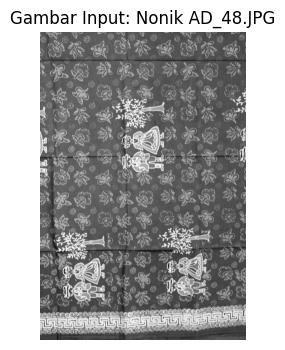

===== HASIL PREDIKSI DNN =====
Probabilitas : 100.00%
Index kelas  : 1
Label         : Tulis

Memproses: IMG_2933.JPG


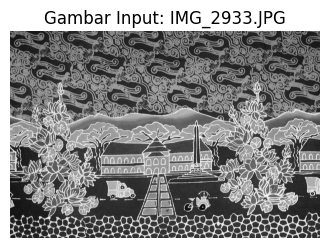

===== HASIL PREDIKSI DNN =====
Probabilitas : 100.00%
Index kelas  : 1
Label         : Tulis

Memproses: IMG_2983.JPG


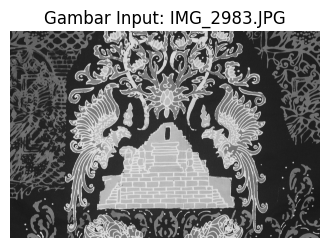

===== HASIL PREDIKSI DNN =====
Probabilitas : 11.08%
Index kelas  : 0
Label         : Cap

Memproses: IMG_8806 (1).JPG


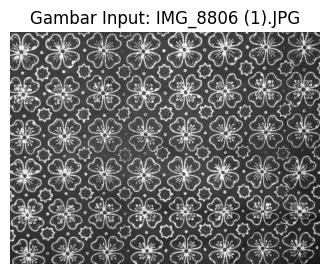

===== HASIL PREDIKSI DNN =====
Probabilitas : 100.00%
Index kelas  : 1
Label         : Tulis

Memproses: IMG_8869.JPG


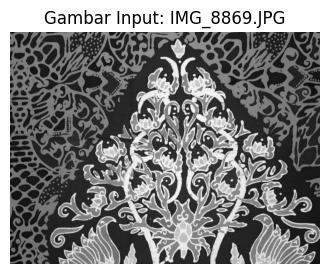

===== HASIL PREDIKSI DNN =====
Probabilitas : 100.00%
Index kelas  : 1
Label         : Tulis

Memproses: IMG_2872.JPG


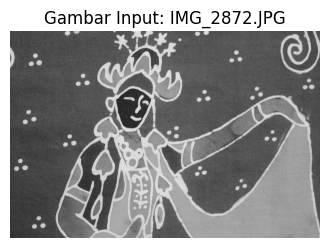

===== HASIL PREDIKSI DNN =====
Probabilitas : 100.00%
Index kelas  : 1
Label         : Tulis

Memproses: IMG_2874.JPG


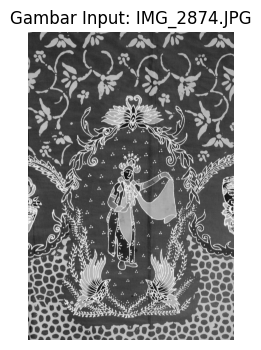

===== HASIL PREDIKSI DNN =====
Probabilitas : 100.00%
Index kelas  : 1
Label         : Tulis


In [ ]:
import numpy as np
import cv2
import joblib
import matplotlib.pyplot as plt
import os

from google.colab import drive
from skimage.feature import graycomatrix, graycoprops, local_binary_pattern
from tensorflow.keras.models import load_model

# =========================
# MOUNT DRIVE
# =========================
drive.mount('/content/drive')

print("=== PREDIKSI DNN DARI FOLDER DRIVE ===")

# =========================
# PATH MODEL
# =========================
model_dir = "/content/drive/MyDrive/PBL/Model"

model_path  = os.path.join(model_dir, "dnn_model_GLCM + LBP.h5")
scaler_path = os.path.join(model_dir, "dnn_scaler_GLCM + LBP.pkl")

print("Model yang dipakai :", model_path)
print("Scaler yang dipakai:", scaler_path)

# =========================
# CEK FILE MODEL
# =========================
if not os.path.exists(model_path):
    raise FileNotFoundError(f"❌ Model tidak ditemukan: {model_path}")

if not os.path.exists(scaler_path):
    raise FileNotFoundError(f"❌ Scaler tidak ditemukan: {scaler_path}")

print("✅ Model & Scaler ditemukan, lanjut...")

# =========================
# LOAD MODEL & SCALER
# =========================
model_dnn = load_model(model_path)
scaler = joblib.load(scaler_path)

# =========================
# PATH FOLDER INPUT GAMBAR (UBAH DI SINI)
# =========================
image_folder = "/content/drive/MyDrive/PBL/Independent Test"

if not os.path.exists(image_folder):
    raise FileNotFoundError(f"❌ Folder tidak ditemukan: {image_folder}")

print(f"\n✅ Mengambil gambar dari folder:\n{image_folder}")

# =========================
# AMBIL SEMUA FILE GAMBAR
# =========================
allowed_ext = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')

image_files = [os.path.join(image_folder, f)
               for f in os.listdir(image_folder)
               if f.lower().endswith(allowed_ext)]

if len(image_files) == 0:
    raise Exception("❌ Tidak ada file gambar yang valid di dalam folder!")

print(f"✅ Ditemukan {len(image_files)} gambar\n")

# =========================
# PROSES SEMUA GAMBAR
# =========================
for filepath in image_files:
    filename = os.path.basename(filepath)
    print(f"\n==============================")
    print(f"Memproses: {filename}")

    # 1. BACA GAMBAR
    img = cv2.imread(filepath, cv2.IMREAD_GRAYSCALE)

    if img is None:
        print("❌ Gagal membaca gambar:", filename)
        continue

    # 2. TAMPILKAN GAMBAR
    plt.figure(figsize=(4,4))
    plt.imshow(img, cmap='gray')
    plt.title(f"Gambar Input: {filename}")
    plt.axis('off')
    plt.show()

    # =========================
    # 3. EKSTRAKSI GLCM
    # =========================
    distances = [1, 2, 3]
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]

    glcm = graycomatrix(
        img,
        distances=distances,
        angles=angles,
        levels=256,
        symmetric=True,
        normed=True
    )

    glcm_feats = np.hstack([
        graycoprops(glcm, prop).flatten()
        for prop in ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation']
    ])

    # =========================
    # 4. EKSTRAKSI LBP
    # =========================
    radius = 1
    n_points = 8 * radius
    n_bins = n_points + 2

    lbp = local_binary_pattern(img, n_points, radius, method='uniform')

    hist, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)

    # =========================
    # 5. GABUNGKAN FITUR
    # =========================
    fitur = np.hstack((glcm_feats, hist)).reshape(1, -1)

    # =========================
    # 6. NORMALISASI
    # =========================
    fitur_scaled = scaler.transform(fitur)

    # =========================
    # 7. PREDIKSI
    # =========================
    prob = model_dnn.predict(fitur_scaled, verbose=0)
    pred_class = int((prob > 0.5).astype(int)[0][0])

    prob_percent = prob[0][0] * 100

    print("===== HASIL PREDIKSI DNN =====")
    print(f"Probabilitas : {prob_percent:.2f}%")
    print(f"Index kelas  : {pred_class}")

    # Jika ada nama kelas
    if "classes_names" in globals():
        print(f"Label         : {classes_names[pred_class]}")

**DNN GLCM**

In [ ]:
import os
import joblib

MODEL_DIR = '/content/drive/MyDrive/PBL/Model'
os.makedirs(MODEL_DIR, exist_ok=True)

# === 1. Simpan model DNN ===
dnn_model_path = os.path.join(MODEL_DIR, 'model_dnn_glcm.h5')
model_dnn.save(dnn_model_path)

print(f"✅ Model DNN (GLCM) berhasil disimpan di: {dnn_model_path}")

# === 2. Simpan Scaler ===
scaler_path = os.path.join(MODEL_DIR, 'scaler_glcm.joblib')
joblib.dump(scaler, scaler_path)

print(f"✅ Scaler GLCM disimpan di: {scaler_path}")

# === 3. Simpan Label Encoder ===
label_path = os.path.join(MODEL_DIR, 'label_encoder_glcm.joblib')
joblib.dump(le, label_path)

print(f"✅ Label Encoder GLCM disimpan di: {label_path}")


✅ Model DNN (GLCM) berhasil disimpan di: /content/drive/MyDrive/PBL/Model/model_dnn_glcm.h5
✅ Scaler GLCM disimpan di: /content/drive/MyDrive/PBL/Model/scaler_glcm.joblib
✅ Label Encoder GLCM disimpan di: /content/drive/MyDrive/PBL/Model/label_encoder_glcm.joblib


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Model DNN loaded
✅ Scaler loaded

Membaca gambar dari: /content/drive/MyDrive/PBL/Independent Test
✅ Total gambar ditemukan: 10

Gambar: Nonik AD_28.JPG


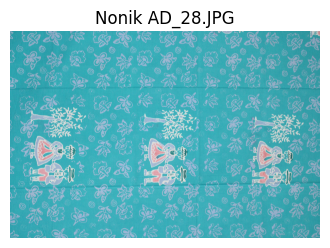

Jumlah fitur awal: 60
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
Jenis Batik  : ✅ Batik Tulis

Gambar: IMG_8890.JPG


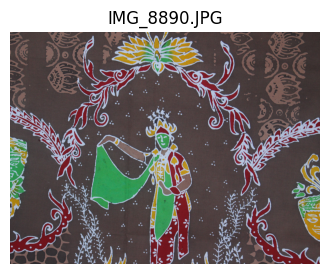

Jumlah fitur awal: 60
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
Jenis Batik  : ✅ Batik Tulis

Gambar: IMG_2959.JPG


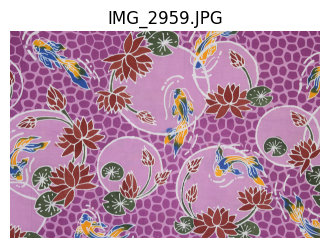

Jumlah fitur awal: 60
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
Jenis Batik  : ✅ Batik Tulis

Gambar: Nonik AD_48.JPG


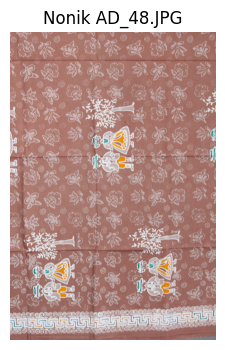

Jumlah fitur awal: 60
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
Jenis Batik  : ✅ Batik Tulis

Gambar: IMG_2933.JPG


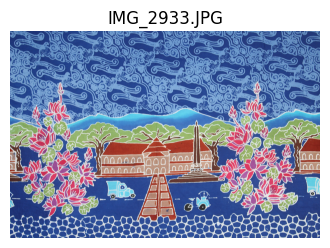

Jumlah fitur awal: 60
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
Jenis Batik  : ✅ Batik Tulis

Gambar: IMG_2983.JPG


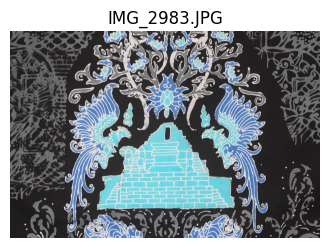

Jumlah fitur awal: 60
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
Jenis Batik  : ✅ Batik Tulis

Gambar: IMG_8806 (1).JPG


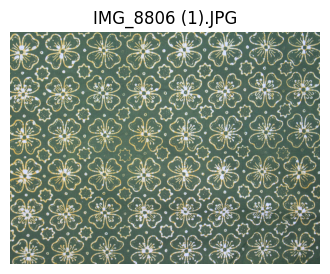

Jumlah fitur awal: 60
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
Jenis Batik  : ✅ Batik Tulis

Gambar: IMG_8869.JPG


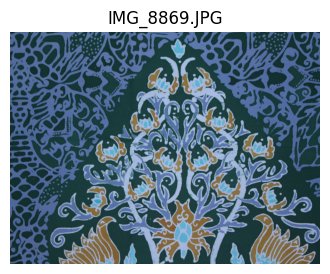

Jumlah fitur awal: 60
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
Jenis Batik  : ✅ Batik Tulis

Gambar: IMG_2872.JPG


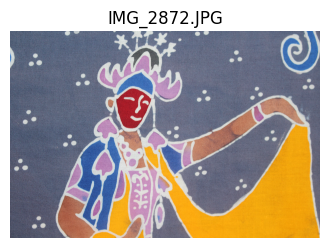

Jumlah fitur awal: 60
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
Jenis Batik  : ✅ Batik Tulis

Gambar: IMG_2874.JPG


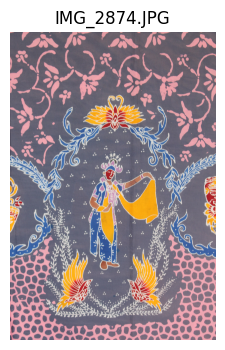

Jumlah fitur awal: 60
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
Jenis Batik  : ✅ Batik Tulis


In [ ]:
import os
import cv2
import numpy as np
import joblib
import matplotlib.pyplot as plt

from google.colab import drive
from tensorflow.keras.models import load_model
from skimage.feature import graycomatrix, graycoprops

# =====================================
# MOUNT GOOGLE DRIVE
# =====================================
drive.mount('/content/drive')

# =====================================
# PATH MODEL & SCALER
# =====================================
MODEL_DIR = "/content/drive/MyDrive/PBL/Model"

model_path  = os.path.join(MODEL_DIR, "model_dnn_glcm.h5")
scaler_path = os.path.join(MODEL_DIR, "scaler_glcm.joblib")

# =====================================
# LOAD MODEL & SCALER
# =====================================
model = load_model(model_path)
print("✅ Model DNN loaded")

scaler = joblib.load(scaler_path)
print("✅ Scaler loaded")

# =====================================
# FOLDER DATA TEST
# =====================================
TEST_DIR = "/content/drive/MyDrive/PBL/Independent Test"

print("\nMembaca gambar dari:", TEST_DIR)

image_paths = [os.path.join(TEST_DIR, f) for f in os.listdir(TEST_DIR)
               if f.lower().endswith(('.jpg','.png','.jpeg'))]

print(f"✅ Total gambar ditemukan: {len(image_paths)}")

# =====================================
# PARAMETER GLCM (WAJIB SAMA)
# =====================================
distances = [1, 2, 3]
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]

# =====================================
# LOOP SEMUA GAMBAR & PREDIKSI
# =====================================
for img_path in image_paths:

    print("\n==============================")
    print("Gambar:", os.path.basename(img_path))

    # Load image gray
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    if img is None:
        print("❌ Gagal membaca gambar")
        continue

    # =====================================
    # TAMPILKAN GAMBAR
    # =====================================
    img_show = cv2.imread(img_path)
    img_show = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(4,4))
    plt.imshow(img_show)
    plt.axis("off")
    plt.title(os.path.basename(img_path))
    plt.show()

    # =====================================
    # Extract GLCM
    # =====================================
    glcm = graycomatrix(img,
                        distances=distances,
                        angles=angles,
                        levels=256,
                        symmetric=True,
                        normed=True)

    glcm_feats = np.hstack([
        graycoprops(glcm, prop).flatten()
        for prop in ['contrast', 'dissimilarity', 'homogeneity',
                     'energy', 'correlation']
    ])

    print("Jumlah fitur awal:", glcm_feats.shape[0])

    # =====================================
    # SAMAKAN KE JUMLAH FITUR MODEL
    # =====================================
    fitur = glcm_feats.reshape(1, -1)

    n_model = scaler.n_features_in_   # jumlah fitur saat training
    n_now   = fitur.shape[1]

    if n_now < n_model:
        pad = np.zeros((1, n_model - n_now))
        fitur = np.hstack((fitur, pad))

    elif n_now > n_model:
        fitur = fitur[:, :n_model]

    print("Jumlah fitur setelah disesuaikan:", fitur.shape[1])

    # Normalisasi
    fitur_scaled = scaler.transform(fitur)

    # Prediksi probabilitas
    pred_prob = model.predict(fitur_scaled, verbose=0)[0][0]

    # Tentukan class
    pred_class = 1 if pred_prob > 0.5 else 0

    # Mapping ke jenis batik
    if pred_class == 0:
        jenis_batik = "✅ Batik Cap"
    else:
        jenis_batik = "✅ Batik Tulis"

    # OUTPUT
    print(f"Probabilitas : {pred_prob*100:.2f}%")
    print(f"Class        : {pred_class}")
    print(f"Jenis Batik  : {jenis_batik}")


**DNN LBP**

In [ ]:
import os
import joblib

# ===============================
# FOLDER SIMPAN
# ===============================
MODEL_DIR = '/content/drive/MyDrive/PBL/Model'
os.makedirs(MODEL_DIR, exist_ok=True)

# ===============================
# 1. SIMPAN MODEL DNN (LBP)
# ===============================
dnn_lbp_path = os.path.join(MODEL_DIR, 'model_dnn_lbp.h5')
model_dnn.save(dnn_lbp_path)

print(f"✅ Model DNN (LBP) berhasil disimpan di:\n{dnn_lbp_path}")

# ===============================
# 2. SIMPAN SCALER (LBP)
# ===============================
scaler_lbp_path = os.path.join(MODEL_DIR, 'scaler_lbp.joblib')
joblib.dump(scaler, scaler_lbp_path)

print(f"✅ Scaler LBP berhasil disimpan di:\n{scaler_lbp_path}")

# ===============================
# 3. SIMPAN LABEL ENCODER (JIKA ADA)
# ===============================
label_lbp_path = os.path.join(MODEL_DIR, 'label_encoder_lbp.joblib')

try:
    joblib.dump(le, label_lbp_path)
    print(f"✅ Label Encoder LBP berhasil disimpan di:\n{label_lbp_path}")
except:
    print("ℹ️ Label Encoder (le) tidak ditemukan, dilewati.")


✅ Model DNN (LBP) berhasil disimpan di:
/content/drive/MyDrive/PBL/Model/model_dnn_lbp.h5
✅ Scaler LBP berhasil disimpan di:
/content/drive/MyDrive/PBL/Model/scaler_lbp.joblib
✅ Label Encoder LBP berhasil disimpan di:
/content/drive/MyDrive/PBL/Model/label_encoder_lbp.joblib


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Model dan scaler berhasil dimuat
✅ Label Encoder dimuat

✅ Total gambar: 10

📂 File: Nonik AD_28.JPG


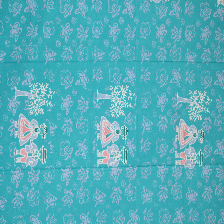

Jumlah fitur awal: 26
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
HASIL        : ✅ Batik Tulis

📂 File: IMG_8890.JPG


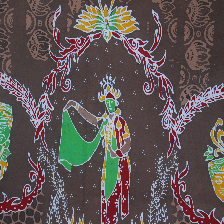

Jumlah fitur awal: 26
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
HASIL        : ✅ Batik Tulis

📂 File: IMG_2959.JPG


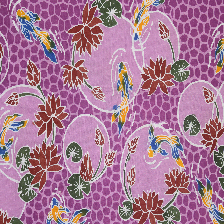

Jumlah fitur awal: 26
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
HASIL        : ✅ Batik Tulis

📂 File: Nonik AD_48.JPG


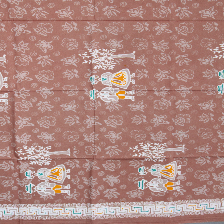

Jumlah fitur awal: 26
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
HASIL        : ✅ Batik Tulis

📂 File: IMG_2933.JPG


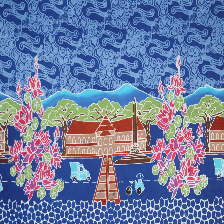

Jumlah fitur awal: 26
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
HASIL        : ✅ Batik Tulis

📂 File: IMG_2983.JPG


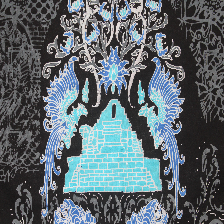

Jumlah fitur awal: 26
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
HASIL        : ✅ Batik Tulis

📂 File: IMG_8806 (1).JPG


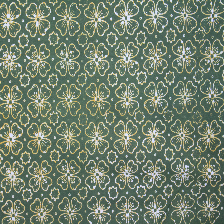

Jumlah fitur awal: 26
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
HASIL        : ✅ Batik Tulis

📂 File: IMG_8869.JPG


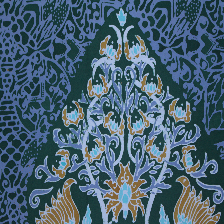

Jumlah fitur awal: 26
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
HASIL        : ✅ Batik Tulis

📂 File: IMG_2872.JPG


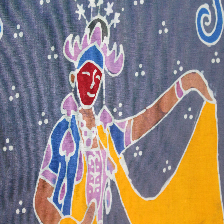

Jumlah fitur awal: 26
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
HASIL        : ✅ Batik Tulis

📂 File: IMG_2874.JPG


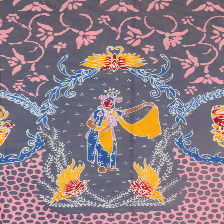

Jumlah fitur awal: 26
Jumlah fitur setelah disesuaikan: 70
Probabilitas : 100.00%
Class        : 1
HASIL        : ✅ Batik Tulis


In [ ]:
import os
import cv2
import numpy as np
import joblib
import matplotlib.pyplot as plt

from google.colab import drive
from google.colab.patches import cv2_imshow
from tensorflow.keras.models import load_model
from skimage.feature import local_binary_pattern

# ============================
# MOUNT GOOGLE DRIVE
# ============================
drive.mount('/content/drive')

# ============================
# PATH MODEL & SCALER
# ============================
MODEL_DIR = "/content/drive/MyDrive/PBL/Model"

MODEL_PATH   = os.path.join(MODEL_DIR, "model_dnn_lbp.h5")
SCALER_PATH  = os.path.join(MODEL_DIR, "scaler_lbp.joblib")
LABEL_PATH   = os.path.join(MODEL_DIR, "label_encoder_lbp.joblib")

# ============================
# LOAD MODEL, SCALER, LABEL
# ============================
model = load_model(MODEL_PATH)
scaler = joblib.load(SCALER_PATH)

print("✅ Model dan scaler berhasil dimuat")

# Label encoder (optional)
if os.path.exists(LABEL_PATH):
    le = joblib.load(LABEL_PATH)
    print("✅ Label Encoder dimuat")
else:
    print("⚠️ Label Encoder tidak ditemukan")

# ============================
# FOLDER TEST
# ============================
TEST_DIR = "/content/drive/MyDrive/PBL/Independent Test"

image_paths = [os.path.join(TEST_DIR, f) for f in os.listdir(TEST_DIR)
               if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

print("\n✅ Total gambar:", len(image_paths))

# ============================
# PARAMETER LBP (SAMAKAN)
# ============================
radius = 3
n_points = 8 * radius
METHOD = "uniform"

# ============================
# LOOP PREDIKSI
# ============================
for img_path in image_paths:

    print("\n==============================")
    print("📂 File:", os.path.basename(img_path))

    # Load & resize
    image = cv2.imread(img_path)
    image = cv2.resize(image, (224,224))
    gray  = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Tampilkan gambar
    cv2_imshow(image)

    # ----------------------------
    # EKSTRAKSI LBP
    # ----------------------------
    lbp = local_binary_pattern(gray, n_points, radius, METHOD)

    (hist, _) = np.histogram(
        lbp.ravel(),
        bins=np.arange(0, n_points + 3),
        range=(0, n_points + 2)
    )

    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)

    X = hist.reshape(1, -1)

    print("Jumlah fitur awal:", X.shape[1])

    # ----------------------------
    # SESUAIKAN FITUR → 70
    # ----------------------------
    n_model = scaler.n_features_in_   # biasanya 70
    n_now   = X.shape[1]              # sekarang

    if n_now < n_model:
        pad = np.zeros((1, n_model - n_now))
        X = np.hstack((X, pad))

    elif n_now > n_model:
        X = X[:, :n_model]

    print("Jumlah fitur setelah disesuaikan:", X.shape[1])

    # ----------------------------
    # NORMALISASI
    # ----------------------------
    X = scaler.transform(X)

    # ----------------------------
    # PREDIKSI
    # ----------------------------
    pred_prob  = model.predict(X, verbose=0)[0][0]
    pred_class = 1 if pred_prob > 0.5 else 0

    # Mapping
    if pred_class == 0:
        jenis = "✅ Batik Cap"
    else:
        jenis = "✅ Batik Tulis"

    print(f"Probabilitas : {pred_prob*100:.2f}%")
    print(f"Class        : {pred_class}")
    print("HASIL        :", jenis)


**CNN RAW IMAGE**

In [ ]:

save_dir = "/content/drive/MyDrive/PBL/Model"

if not os.path.exists(save_dir):
    os.makedirs(save_dir)
    print(f"[INFO] Folder dibuat: {save_dir}")

cnn_model_path = os.path.join(save_dir, "cnn_model_224x224.keras")

model_cnn.save(cnn_model_path)

print("="*60)
print("✅ MODEL CNN BERHASIL DISIMPAN")
print(f"Lokasi: {cnn_model_path}")
print("="*60)


✅ MODEL CNN BERHASIL DISIMPAN
Lokasi: /content/drive/MyDrive/PBL/Model/cnn_model_224x224.keras


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Jumlah gambar ditemukan: 10

File: Nonik AD_28.JPG


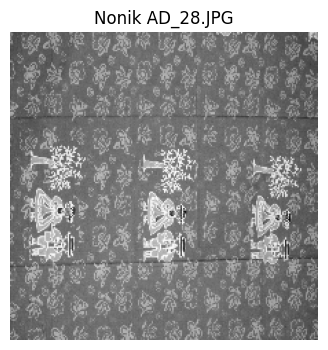

Shape input: (1, 224, 224, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 823ms/step
===== HASIL PREDIKSI CNN =====
Label        : Cap
Index kelas  : 0
Probabilitas : 18.87 %

File: IMG_8890.JPG


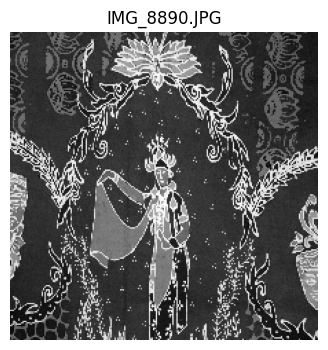

Shape input: (1, 224, 224, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
===== HASIL PREDIKSI CNN =====
Label        : Cap
Index kelas  : 0
Probabilitas : 100.0 %

File: IMG_2959.JPG


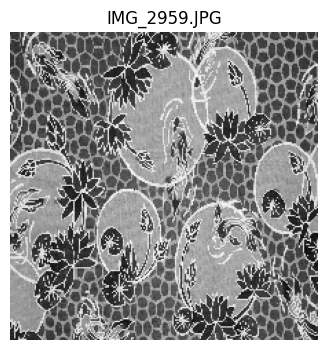

Shape input: (1, 224, 224, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
===== HASIL PREDIKSI CNN =====
Label        : Cap
Index kelas  : 0
Probabilitas : 52.99 %

File: Nonik AD_48.JPG


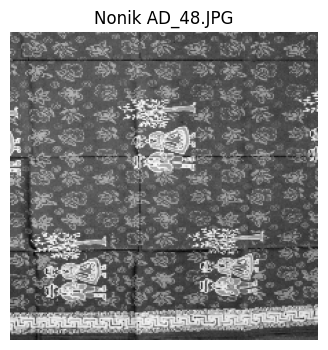

Shape input: (1, 224, 224, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
===== HASIL PREDIKSI CNN =====
Label        : Cap
Index kelas  : 0
Probabilitas : 0.17 %

File: IMG_2933.JPG


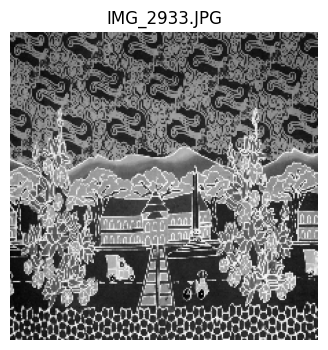

Shape input: (1, 224, 224, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
===== HASIL PREDIKSI CNN =====
Label        : Cap
Index kelas  : 0
Probabilitas : 99.78 %

File: IMG_2983.JPG


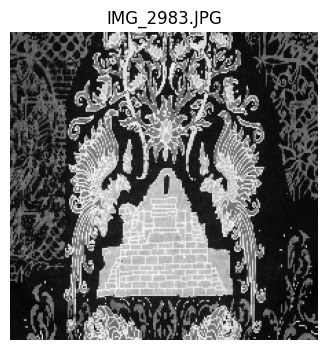

Shape input: (1, 224, 224, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
===== HASIL PREDIKSI CNN =====
Label        : Cap
Index kelas  : 0
Probabilitas : 100.0 %

File: IMG_8806 (1).JPG


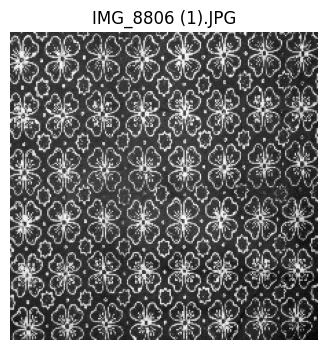

Shape input: (1, 224, 224, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
===== HASIL PREDIKSI CNN =====
Label        : Cap
Index kelas  : 0
Probabilitas : 40.41 %

File: IMG_8869.JPG


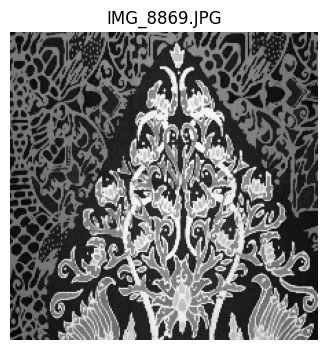

Shape input: (1, 224, 224, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
===== HASIL PREDIKSI CNN =====
Label        : Cap
Index kelas  : 0
Probabilitas : 100.0 %

File: IMG_2872.JPG


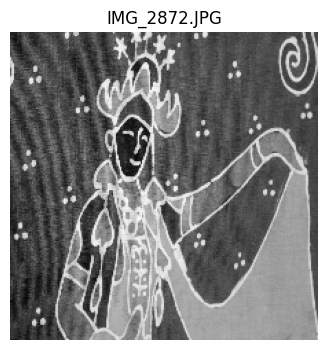

Shape input: (1, 224, 224, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
===== HASIL PREDIKSI CNN =====
Label        : Cap
Index kelas  : 0
Probabilitas : 100.0 %

File: IMG_2874.JPG


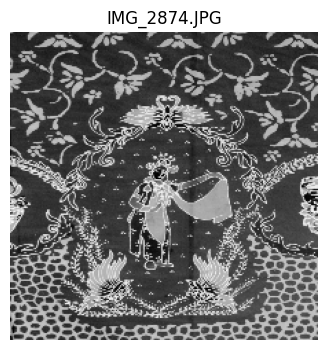

Shape input: (1, 224, 224, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
===== HASIL PREDIKSI CNN =====
Label        : Cap
Index kelas  : 0
Probabilitas : 3.28 %


In [ ]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from google.colab import drive
from tensorflow.keras.models import load_model

# ======================================
# MOUNT GOOGLE DRIVE
# ======================================
drive.mount('/content/drive')

# ======================================
# LOAD MODEL CNN KAMU
# ======================================
MODEL_PATH = '/content/drive/MyDrive/PBL/Model/cnn_model_224x224.keras'
model_cnn = load_model(MODEL_PATH)

# ======================================
# NAMA KELAS (Harus sama dengan saat training)
# ======================================
classes_names = ['Cap', 'Tulis']   # ganti sesuai dataset kamu

# ======================================
# FOLDER GAMBAR YANG INGIN DIPREDIKSI
# ======================================
FOLDER_PATH = '/content/drive/MyDrive/PBL/Independent Test'

# ======================================
# AMBIL SEMUA FILE GAMBAR
# ======================================
image_files = [f for f in os.listdir(FOLDER_PATH)
               if f.lower().endswith(('.png','.jpg','.jpeg','.bmp','.tif'))]

print("Jumlah gambar ditemukan:", len(image_files))

if len(image_files) == 0:
    print("❌ Tidak ada gambar dalam folder!")
    exit()

# ======================================
# LOOP SETIAP GAMBAR
# ======================================
for file in image_files:

    img_path = os.path.join(FOLDER_PATH, file)
    print("\nFile:", file)

    # ===============================
    # BACA & PREPROCESS
    # ===============================
    img = cv2.imread(img_path)

    if img is None:
        print("❌ Gagal membaca:", file)
        continue

    # Grayscale
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Resize
    img = cv2.resize(img, (224, 224))

    # Tampilkan
    plt.figure(figsize=(4,4))
    plt.imshow(img, cmap='gray')
    plt.title(file)
    plt.axis("off")
    plt.show()

    # Normalisasi
    img = img / 255.0

    # Bentuk ke (1, 224, 224, 1)
    img = np.expand_dims(img, axis=-1)
    img = np.expand_dims(img, axis=0)

    print("Shape input:", img.shape)

    # ===============================
    # PREDIKSI
    # ===============================
    prob = model_cnn.predict(img)

    index_kelas = np.argmax(prob)
    probabilitas = np.max(prob)
    label = classes_names[index_kelas]

    print("===== HASIL PREDIKSI CNN =====")
    print("Label        :", label)
    print("Index kelas  :", index_kelas)
    print("Probabilitas :", round(float(probabilitas) * 100, 2), "%")
    print("="*50)


**SVM GLCM + LBP**

In [ ]:
import joblib
import os

save_dir = "/content/drive/MyDrive/PBL/Model"

# Buat folder kalau belum ada
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
    print(f"[INFO] Folder dibuat: {save_dir}")

safe_name = feature_name.replace(" ", "_").replace("+", "PLUS")

svm_model_path   = os.path.join(save_dir, f"svm_model_{safe_name}.pkl")
scaler_model_path = os.path.join(save_dir, f"svm_scaler_{safe_name}.pkl")

# Simpan model SVM
joblib.dump(svm, svm_model_path)

# Simpan scaler
joblib.dump(scaler, scaler_model_path)

print("="*60)
print("✅ MODEL SVM BERHASIL DISIMPAN")
print(f"Fitur  : {feature_name}")
print(f"Model  : {svm_model_path}")
print(f"Scaler : {scaler_model_path}")
print("="*60)


✅ MODEL SVM BERHASIL DISIMPAN
Fitur  : GLCM + LBP
Model  : /content/drive/MyDrive/PBL/Model/svm_model_GLCM_PLUS_LBP.pkl
Scaler : /content/drive/MyDrive/PBL/Model/svm_scaler_GLCM_PLUS_LBP.pkl


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Model & Scaler dimuat
✅ Total gambar ditemukan: 10

📁 File : Nonik AD_28.JPG


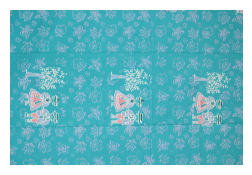

✅ Jumlah fitur: 70
Probabilitas : 100.00%
Index kelas  : 1
Label hasil  : ✅ Batik Tulis

📁 File : IMG_8890.JPG


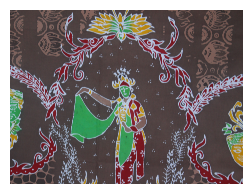

✅ Jumlah fitur: 70
Probabilitas : 100.00%
Index kelas  : 1
Label hasil  : ✅ Batik Tulis

📁 File : IMG_2959.JPG


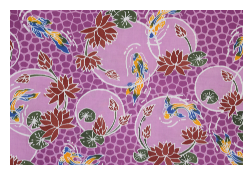

✅ Jumlah fitur: 70
Probabilitas : 100.00%
Index kelas  : 1
Label hasil  : ✅ Batik Tulis

📁 File : Nonik AD_48.JPG


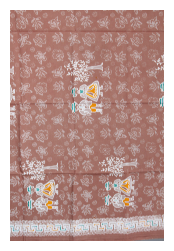

✅ Jumlah fitur: 70
Probabilitas : 100.00%
Index kelas  : 1
Label hasil  : ✅ Batik Tulis

📁 File : IMG_2933.JPG


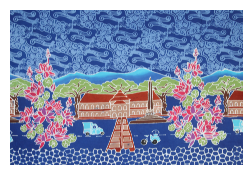

✅ Jumlah fitur: 70
Probabilitas : 100.00%
Index kelas  : 1
Label hasil  : ✅ Batik Tulis

📁 File : IMG_2983.JPG


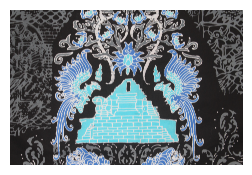

✅ Jumlah fitur: 70
Probabilitas : 100.00%
Index kelas  : 1
Label hasil  : ✅ Batik Tulis

📁 File : IMG_8806 (1).JPG


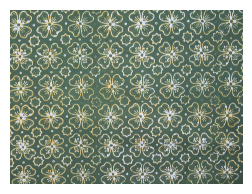

✅ Jumlah fitur: 70
Probabilitas : 100.00%
Index kelas  : 1
Label hasil  : ✅ Batik Tulis

📁 File : IMG_8869.JPG


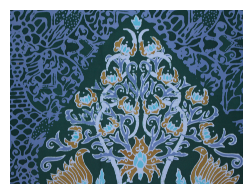

✅ Jumlah fitur: 70
Probabilitas : 100.00%
Index kelas  : 1
Label hasil  : ✅ Batik Tulis

📁 File : IMG_2872.JPG


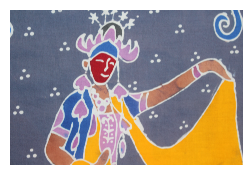

✅ Jumlah fitur: 70
Probabilitas : 100.00%
Index kelas  : 1
Label hasil  : ✅ Batik Tulis

📁 File : IMG_2874.JPG


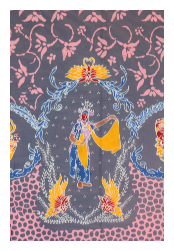

✅ Jumlah fitur: 70
Probabilitas : 100.00%
Index kelas  : 1
Label hasil  : ✅ Batik Tulis


In [ ]:
import numpy as np
import cv2
import os
import joblib
import matplotlib.pyplot as plt

from google.colab import drive
from skimage.feature import local_binary_pattern, graycomatrix, graycoprops
from scipy.special import softmax
from google.colab.patches import cv2_imshow

# ===============================
# 1. MOUNT GOOGLE DRIVE
# ===============================
drive.mount('/content/drive')

# ===============================
# 2. PATH MODEL & SCALER
# ===============================
MODEL_DIR   = "/content/drive/MyDrive/PBL/Model"
TEST_DIR    = "/content/drive/MyDrive/PBL/Independent Test"

model_path  = os.path.join(MODEL_DIR, "svm_model_GLCM_PLUS_LBP.pkl")
scaler_path = os.path.join(MODEL_DIR, "svm_scaler_GLCM_PLUS_LBP.pkl")

# Load model & scaler
svm_model = joblib.load(model_path)
scaler    = joblib.load(scaler_path)

print("✅ Model & Scaler dimuat")

# ===============================
# 3. AMBIL SEMUA GAMBAR
# ===============================
image_paths = [os.path.join(TEST_DIR, f) for f in os.listdir(TEST_DIR)
               if f.lower().endswith(('.jpg','.jpeg','.png'))]

print(f"✅ Total gambar ditemukan: {len(image_paths)}")

# ===============================
# 4. FUNGSI EKSTRAKSI (70 FITUR)
# ===============================
def extract_glcm_lbp(img):

    img = cv2.resize(img, (128,128))
    img = img.astype(np.uint8)

    # ------------ LBP (64 fitur) ------------
    radius = 1
    n_points = 8 * radius   # 8

    lbp = local_binary_pattern(img, n_points, radius, method="default")

    lbp_hist, _ = np.histogram(
        lbp.ravel(),
        bins=64,
        range=(0, 256)
    )

    lbp_hist = lbp_hist.astype("float")
    lbp_hist /= (lbp_hist.sum() + 1e-7)

    # ------------ GLCM (6 fitur) ------------
    glcm = graycomatrix(
        img,
        distances=[1],
        angles=[0],
        levels=256,
        symmetric=True,
        normed=True
    )

    glcm_features = [
        graycoprops(glcm,'contrast')[0,0],
        graycoprops(glcm,'dissimilarity')[0,0],
        graycoprops(glcm,'homogeneity')[0,0],
        graycoprops(glcm,'energy')[0,0],
        graycoprops(glcm,'correlation')[0,0],
        graycoprops(glcm,'ASM')[0,0]
    ]

    # Gabung = 70 fitur
    features = np.hstack([lbp_hist, glcm_features])

    return features.reshape(1, -1)

# ===============================
# 5. LOOP SEMUA GAMBAR
# ===============================
label_names = ["Batik Cap", "Batik Tulis"]

for path in image_paths:

    print("\n==============================")
    print("📁 File :", os.path.basename(path))

    # Baca gambar grayscale
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

    if img is None:
        print("❌ Gagal membaca gambar")
        continue

    # Tampilkan gambar
    img_rgb = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(3,3))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.show()

    # =========================
    # EKSTRAKSI FITUR
    # =========================
    features = extract_glcm_lbp(img)
    print("✅ Jumlah fitur:", features.shape[1])

    # Pastikan 70 fitur
    n_model = scaler.n_features_in_
    n_now   = features.shape[1]

    if n_now < n_model:
        pad = np.zeros((1, n_model - n_now))
        features = np.hstack((features, pad))

    elif n_now > n_model:
        features = features[:, :n_model]

    # =========================
    # SCALING
    # =========================
    features_scaled = scaler.transform(features)

    # =========================
    # PREDIKSI SVM
    # =========================
    decision = svm_model.decision_function(features_scaled)

    # Jika binary class → softmax manual
    if decision.ndim == 1:
        decision = np.vstack([-decision, decision]).T

    probabilities = softmax(decision, axis=1)

    prob  = np.max(probabilities)
    index = np.argmax(probabilities)

    # =========================
    # OUTPUT
    # =========================
    print(f"Probabilitas : {prob*100:.2f}%")
    print(f"Index kelas  : {index}")
    print(f"Label hasil  : ✅ {label_names[index]}")


**SVM GLCM**

In [ ]:
import joblib

# -------------------------------
# Simpan Model SVM (GLCM)
# -------------------------------

# Tentukan nama file
svm_model_path = "/content/drive/MyDrive/PBL/model_svm_glcm.joblib"
svm_scaler_path = "/content/drive/MyDrive/PBL/scaler_glcm.joblib"
label_encoder_path = "/content/drive/MyDrive/PBL/label_encoder.joblib"

# Simpan model SVM
joblib.dump(svm, svm_model_path)
print(f"✅ Model SVM (GLCM) tersimpan di: {svm_model_path}")

# Simpan scaler
joblib.dump(scaler, svm_scaler_path)
print(f"✅ Scaler SVM (GLCM) tersimpan di: {svm_scaler_path}")

# Simpan label encoder
joblib.dump(le, label_encoder_path)
print(f"✅ Label encoder tersimpan di: {label_encoder_path}")


✅ Model SVM (GLCM) tersimpan di: /content/drive/MyDrive/PBL/model_svm_glcm.joblib
✅ Scaler SVM (GLCM) tersimpan di: /content/drive/MyDrive/PBL/scaler_glcm.joblib
✅ Label encoder tersimpan di: /content/drive/MyDrive/PBL/label_encoder.joblib


In [ ]:
import joblib

# -------------------------------
# Simpan Model SVM (GLCM)
# -------------------------------

# Tentukan nama file
svm_model_path = "/content/drive/MyDrive/PBL/model_svm_glcm.joblib"
svm_scaler_path = "/content/drive/MyDrive/PBL/scaler_glcm.joblib"
label_encoder_path = "/content/drive/MyDrive/PBL/label_encoder.joblib"

# Simpan model SVM
joblib.dump(svm, svm_model_path)
print(f"✅ Model SVM (GLCM) tersimpan di: {svm_model_path}")

# Simpan scaler
joblib.dump(scaler, svm_scaler_path)
print(f"✅ Scaler SVM (GLCM) tersimpan di: {svm_scaler_path}")

# Simpan label encoder
joblib.dump(le, label_encoder_path)
print(f"✅ Label encoder tersimpan di: {label_encoder_path}")


✅ Model SVM (GLCM) tersimpan di: /content/drive/MyDrive/PBL/model_svm_glcm.joblib
✅ Scaler SVM (GLCM) tersimpan di: /content/drive/MyDrive/PBL/scaler_glcm.joblib
✅ Label encoder tersimpan di: /content/drive/MyDrive/PBL/label_encoder.joblib


**SVM LBP**

In [ ]:
# ============================================
# SIMPAN MODEL SVM KHUSUS FITUR "LBP Only"
# ============================================

# Ambil data LBP dari dictionary
X_lbp = feature_scenarios["LBP Only"]

# Split ulang data khusus LBP (HARUS sama seperti training)
X_train_lbp, X_test_lbp, y_train_lbp, y_test_lbp = train_test_split(
    X_lbp, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

# Scaling ulang khusus LBP
scaler_lbp = StandardScaler()
X_train_lbp_scaled = scaler_lbp.fit_transform(X_train_lbp)

# Train ulang model LBP agar variabel tersedia
svm_lbp = SVC(kernel='linear', random_state=42)
svm_lbp.fit(X_train_lbp_scaled, y_train_lbp)

print("✅ Model SVM LBP berhasil dibuat ulang untuk proses penyimpanan!")

# =====================
# Simpan model & scaler
# =====================
import joblib

svm_lbp_model_path = "/content/drive/MyDrive/PBL/model_svm_lbp.joblib"
svm_lbp_scaler_path = "/content/drive/MyDrive/PBL/scaler_lbp.joblib"
label_encoder_path = "/content/drive/MyDrive/PBL/label_encoder.joblib"

# Simpan model
joblib.dump(svm_lbp, svm_lbp_model_path)
print(f"Model SVM LBP tersimpan di {svm_lbp_model_path}")

# Simpan scaler
joblib.dump(scaler_lbp, svm_lbp_scaler_path)
print(f"Scaler LBP tersimpan di {svm_lbp_scaler_path}")

# Simpan label encoder
joblib.dump(le, label_encoder_path)
print("Label encoder tersimpan!")


✅ Model SVM LBP berhasil dibuat ulang untuk proses penyimpanan!
Model SVM LBP tersimpan di /content/drive/MyDrive/PBL/model_svm_lbp.joblib
Scaler LBP tersimpan di /content/drive/MyDrive/PBL/scaler_lbp.joblib
Label encoder tersimpan!


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Scaler LBP dimuat
✅ Model LBP & Encoder berhasil dimuat
✅ Model membutuhkan 10 fitur
✅ Total gambar: 10

File : Nonik AD_28.JPG


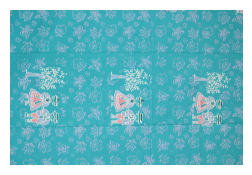

Probabilitas : 90.66%
Index kelas  : 1
Label model  : Tulis
✅ HASIL AKHIR : BATIK TULIS

File : IMG_8890.JPG


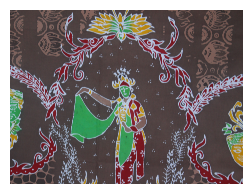

Probabilitas : 99.98%
Index kelas  : 1
Label model  : Tulis
✅ HASIL AKHIR : BATIK TULIS

File : IMG_2959.JPG


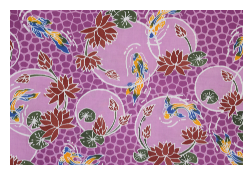

Probabilitas : 100.00%
Index kelas  : 1
Label model  : Tulis
✅ HASIL AKHIR : BATIK TULIS

File : Nonik AD_48.JPG


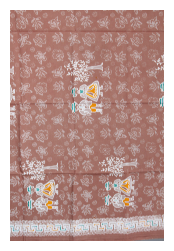

Probabilitas : 97.34%
Index kelas  : 1
Label model  : Tulis
✅ HASIL AKHIR : BATIK TULIS

File : IMG_2933.JPG


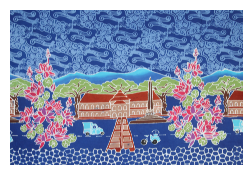

Probabilitas : 100.00%
Index kelas  : 1
Label model  : Tulis
✅ HASIL AKHIR : BATIK TULIS

File : IMG_2983.JPG


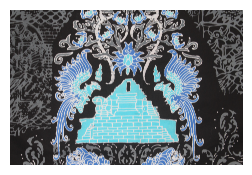

Probabilitas : 99.91%
Index kelas  : 1
Label model  : Tulis
✅ HASIL AKHIR : BATIK TULIS

File : IMG_8806 (1).JPG


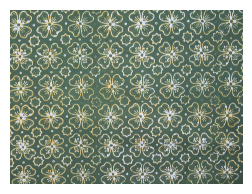

Probabilitas : 100.00%
Index kelas  : 1
Label model  : Tulis
✅ HASIL AKHIR : BATIK TULIS

File : IMG_8869.JPG


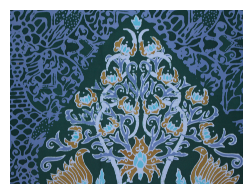

Probabilitas : 99.71%
Index kelas  : 1
Label model  : Tulis
✅ HASIL AKHIR : BATIK TULIS

File : IMG_2872.JPG


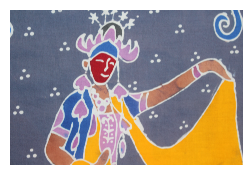

Probabilitas : 100.00%
Index kelas  : 1
Label model  : Tulis
✅ HASIL AKHIR : BATIK TULIS

File : IMG_2874.JPG


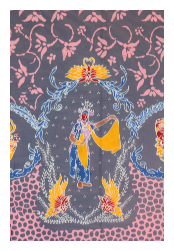

Probabilitas : 99.87%
Index kelas  : 1
Label model  : Tulis
✅ HASIL AKHIR : BATIK TULIS


In [ ]:
import os
import cv2
import joblib
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
from skimage.feature import local_binary_pattern
from scipy.special import softmax

# ===============================
# MOUNT GOOGLE DRIVE
# ===============================
drive.mount('/content/drive')

# ===============================
# PATH MODEL & FOLDER TEST
# ===============================
MODEL_DIR   = "/content/drive/MyDrive/PBL"
TEST_FOLDER = "/content/drive/MyDrive/PBL/Independent Test"

svm_model_path   = os.path.join(MODEL_DIR, "model_svm_lbp.joblib")
scaler_path      = os.path.join(MODEL_DIR, "scaler_lbp.joblib")
encoder_path     = os.path.join(MODEL_DIR, "label_encoder.joblib")

# ===============================
# LOAD MODEL
# ===============================
svm_model = joblib.load(svm_model_path)
encoder   = joblib.load(encoder_path)

if os.path.exists(scaler_path):
    scaler = joblib.load(scaler_path)
    print("✅ Scaler LBP dimuat")
else:
    scaler = None
    print("⚠️ Tidak ada scaler")

print("✅ Model LBP & Encoder berhasil dimuat")

# Jumlah fitur model
n_model_features = svm_model.n_features_in_
print("✅ Model membutuhkan", n_model_features, "fitur")

# ===============================
# AMBIL GAMBAR TEST
# ===============================
image_paths = [
    os.path.join(TEST_FOLDER, f)
    for f in os.listdir(TEST_FOLDER)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
]

print("✅ Total gambar:", len(image_paths))

# ===============================
# FUNGSI LBP
# ===============================
def extract_lbp_features(img, radius=1, n_points=8):

    # Compute LBP
    lbp = local_binary_pattern(img, n_points, radius, method='uniform')

    # Histogram (59 bins untuk uniform LBP)
    hist, _ = np.histogram(
        lbp.ravel(),
        bins=np.arange(0, n_points + 3),
        range=(0, n_points + 2)
    )

    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)

    return hist

# ===============================
# LOOP PREDIKSI
# ===============================
label_names = encoder.classes_

for path in image_paths:

    print("\n========================================")
    print("File :", os.path.basename(path))

    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

    if img is None:
        print("❌ Gagal membaca gambar")
        continue

    # Tampilkan gambar
    img_rgb = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(3,3))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

    # =========================
    # EKSTRAKSI LBP
    # =========================
    features = extract_lbp_features(img)
    X = features.reshape(1, -1)

    # Samakan panjang fitur ke model
    if X.shape[1] < n_model_features:
        X = np.hstack((X, np.zeros((1, n_model_features - X.shape[1]))))
    elif X.shape[1] > n_model_features:
        X = X[:, :n_model_features]

    # Scaling
    if scaler is not None:
        X = scaler.transform(X)

    # =========================
    # PREDIKSI SVM
    # =========================
    decision = svm_model.decision_function(X)

    # Konversi ke probabilitas
    if decision.ndim == 1:
        decision = np.vstack([-decision, decision]).T

    probabilities = softmax(decision, axis=1)

    prob  = np.max(probabilities)
    index = np.argmax(probabilities)
    label = label_names[index]

    # =========================
    # KONVERSI LABEL
    # =========================
    if str(label).lower() in ["cap", "batik cap"]:
        hasil = "BATIK CAP"
    elif str(label).lower() in ["tulis", "batik tulis"]:
        hasil = "BATIK TULIS"
    else:
        hasil = str(label)

    # =========================
    # OUTPUT HASIL
    # =========================
    print(f"Probabilitas : {prob*100:.2f}%")
    print(f"Index kelas  : {index}")
    print(f"Label model  : {label}")
    print(f"✅ HASIL AKHIR : {hasil}")
